# About Dataset

This dataset has 17 classes.
Data are divided into three partitions: train, val and test.

Variable Information
Class Labels:
-    0 : Beet Armyworm
-    1 : Black Hairy
-    2 : Cutworm
-    3 : Field Cricket
-    4 : Jute Aphid
-    5 : Jute Hairy
-    6 : Jute Red Mite
-    7 : Jute Semilooper
-    8 : Jute Stem Girdler
-    9 : Jute Stem Weevil
-    10 : Leaf Beetle
-    11 : Mealybug
-    12 : Pod Borer
-    13 : Scopula Emissaria
-    14 : Termite
-    15 : Termite odontotermes (Rambur)
-    16 : Yellow Mite

# Read and Preprocessing the Dataset

In [1]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Path to the dataset (Update this if needed)
dataset_path = "Jute_Pest_Dataset"
subsets = ["train", "test", "val"]  # Subfolders within dataset

# Initialize variables
image_stats = {subset: {} for subset in subsets}
total_images_per_subset = {subset: 0 for subset in subsets}
image_sizes = set()
image_modes = set()

# Helper function to analyze dataset

def analyze_folder(subset_path):
    class_counts = {}
    for class_name in sorted(os.listdir(subset_path)):  # Ensure consistent class order
        class_folder = os.path.join(subset_path, class_name)
        if os.path.isdir(class_folder):
            image_count = 0
            for image_name in os.listdir(class_folder):
                image_path = os.path.join(class_folder, image_name)
                try:
                    with Image.open(image_path) as img:
                        image_count += 1
                        image_sizes.add(img.size)
                        image_modes.add(img.mode)
                except Exception as e:
                    print(f"Skipping invalid image {image_path}: {e}")
            class_counts[class_name] = image_count
    return class_counts

# Analyze all subsets
for subset in subsets:
    subset_path = os.path.join(dataset_path, subset)
    if os.path.exists(subset_path):
        image_stats[subset] = analyze_folder(subset_path)
        total_images_per_subset[subset] = sum(image_stats[subset].values())

# Plotting functions
def plot_bar_chart(data, title):
    plt.figure(figsize=(12, 6))
    for subset, class_counts in data.items():
        plt.bar(class_counts.keys(), class_counts.values(), label=subset, alpha=0.7)
    plt.title(title)
    plt.xlabel("Class")
    plt.ylabel("Number of Images")
    plt.xticks(rotation=45)
    plt.legend()
    plt.show()

def plot_pie_chart(data, title):
    plt.figure(figsize=(8, 8))
    plt.pie(data.values(), labels=data.keys(), autopct='%1.1f%%', startangle=140, colors=plt.cm.Paired.colors)
    plt.title(title)
    plt.show()

# Summarize and visualize results
print(f"Analysis for Dataset:")
total_images = sum(total_images_per_subset.values())
print(f" - Total Images in Dataset: {total_images}")
for subset, count in total_images_per_subset.items():
    print(f" - {subset.capitalize()} Set: {count} images")

# Per-class analysis
for subset in subsets:
    if image_stats[subset]:
        print(f"\n{subset.capitalize()} Set Class Distribution:")
        for class_name, count in image_stats[subset].items():
            print(f"   - {class_name}: {count} images")
        plot_bar_chart({subset: image_stats[subset]}, f"Number of Images per Class in {subset.capitalize()} Set")
        plot_pie_chart(image_stats[subset], f"Class Distribution in {subset.capitalize()} Set")

# Check image properties
print("\nImage Properties Analysis:")
print(f"All images have the same size: {len(image_sizes) == 1}")
if image_sizes:
    print(f" - Image sizes: {image_sizes}")
else:
    print(" - No valid images found.")

print(f"All images are Colored (RGB): {image_modes == {'RGB'}}")
print(f" - Image modes found: {image_modes}")

KeyboardInterrupt: 

**Notice:** The dataset is imbalance.

**Notice:** There was an unreadable image so i have changed it's name to image1.

In [ ]:
import cv2
img = cv2.imread("D:\\Telegram Downloads\\Old Materials\\Fourth Year First Term\\Neural Networks and Deep Learning\\Jute_Pest_Dataset\\train\\Jute Red Mite\\image1.jpg")
if img is None:
    print("Image is corrupt or unreadable")
else:
    print("Image is fine")

Image is fine


Make the dataset balanced by making augmentation on minor classes and save augmented images in its folder.

In [ ]:
import os
import cv2
import shutil
import albumentations as A
from albumentations.pytorch import ToTensorV2
import numpy as np
from tqdm import tqdm

# Define your dataset path
dataset_path = "Jute_Pest_Dataset/train"  # Replace with the actual folder containing combined images

# List all class folders
folders = [f for f in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, f))]

# Count the number of images in each folder
image_counts = {folder: len(os.listdir(os.path.join(dataset_path, folder))) for folder in folders}

# Find the maximum number of images in any folder (excluding the one with the highest count)
max_images = max(image_counts.values())

print(f"Image counts per folder: {image_counts}")
print(f"Highest image count: {max_images}")

# Define augmentation transformations (customize as needed)
augmentations = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.3),
    A.Rotate(limit=25, p=0.5),
    A.GaussNoise(p=0.3),
    A.Resize(224, 224),
])

# Function to apply augmentation and save new images
def augment_and_save(image_path, save_folder, count):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Skipping corrupt image: {image_path}")
        return
    
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Apply augmentation
    augmented = augmentations(image=image)['image']
    
    # Convert image back to BGR for OpenCV
    augmented = cv2.cvtColor(augmented, cv2.COLOR_RGB2BGR)

    new_filename = f"aug_{count}.jpg"
    cv2.imwrite(os.path.join(save_folder, new_filename), augmented)

# Augment images for folders with fewer images
for folder in tqdm(folders, desc="Augmenting folders"):
    folder_path = os.path.join(dataset_path, folder)
    current_count = image_counts[folder]
    needed = max_images - current_count  # Number of images to add

    if needed == 0:
        continue  # Skip already balanced folder

    images = os.listdir(folder_path)
    num_images = len(images)

    print(f"Augmenting {folder} with {needed} additional images...")

    # Start augmentation from the first image in the folder
    count = 0
    while current_count < max_images:
        img_index = count % num_images  # Loop over images if needed
        img_path = os.path.join(folder_path, images[img_index])
        
        augment_and_save(img_path, folder_path, current_count + 1)
        
        current_count += 1
        count += 1  # Move to the next image for augmentation

print("Augmentation completed successfully!")

Image counts per folder: {'Beet Armyworm': 199, 'Black Hairy': 309, 'Cutworm': 399, 'Field Cricket': 392, 'Jute Aphid': 531, 'Jute Hairy': 414, 'Jute Red Mite': 457, 'Jute Semilooper': 372, 'Jute Stem Girdler': 281, 'Jute Stem Weevil': 676, 'Leaf Beetle': 310, 'Mealybug': 466, 'Pod Borer': 384, 'Scopula Emissaria': 320, 'Termite': 291, 'Termite odontotermes (Rambur)': 301, 'Yellow Mite': 342}
Highest image count: 676


Augmenting folders:   0%|          | 0/17 [00:00<?, ?it/s]

Augmenting Beet Armyworm with 477 additional images...


Augmenting folders:   6%|▌         | 1/17 [00:04<01:15,  4.73s/it]

Augmenting Black Hairy with 367 additional images...


Augmenting folders:  12%|█▏        | 2/17 [00:05<00:36,  2.42s/it]

Augmenting Cutworm with 277 additional images...


Augmenting folders:  18%|█▊        | 3/17 [00:06<00:23,  1.67s/it]

Augmenting Field Cricket with 284 additional images...


Augmenting folders:  24%|██▎       | 4/17 [00:07<00:16,  1.29s/it]

Augmenting Jute Aphid with 145 additional images...


Augmenting folders:  29%|██▉       | 5/17 [00:07<00:11,  1.06it/s]

Augmenting Jute Hairy with 262 additional images...


Augmenting folders:  35%|███▌      | 6/17 [00:07<00:09,  1.19it/s]

Augmenting Jute Red Mite with 219 additional images...


Augmenting folders:  41%|████      | 7/17 [00:09<00:09,  1.10it/s]

Augmenting Jute Semilooper with 304 additional images...


Augmenting folders:  47%|████▋     | 8/17 [00:09<00:07,  1.20it/s]

Augmenting Jute Stem Girdler with 395 additional images...


Augmenting folders:  53%|█████▎    | 9/17 [00:10<00:06,  1.15it/s]

Augmenting Leaf Beetle with 366 additional images...


Augmenting folders:  65%|██████▍   | 11/17 [00:11<00:04,  1.43it/s]

Augmenting Mealybug with 210 additional images...


Augmenting folders:  71%|███████   | 12/17 [00:12<00:03,  1.54it/s]

Augmenting Pod Borer with 292 additional images...


Augmenting folders:  76%|███████▋  | 13/17 [00:12<00:02,  1.53it/s]

Augmenting Scopula Emissaria with 356 additional images...


Augmenting folders:  82%|████████▏ | 14/17 [00:13<00:02,  1.46it/s]

Augmenting Termite with 385 additional images...


Augmenting folders:  88%|████████▊ | 15/17 [00:14<00:01,  1.28it/s]

Augmenting Termite odontotermes (Rambur) with 375 additional images...


Augmenting folders:  94%|█████████▍| 16/17 [00:15<00:00,  1.17it/s]

Augmenting Yellow Mite with 334 additional images...


Augmenting folders: 100%|██████████| 17/17 [00:16<00:00,  1.03it/s]

Augmentation completed successfully!


Analysis for Train Dataset:
 - Total Images in Train Set: 11492

Train Set Class Distribution:
   - Beet Armyworm: 676 images
   - Black Hairy: 676 images
   - Cutworm: 676 images
   - Field Cricket: 676 images
   - Jute Aphid: 676 images
   - Jute Hairy: 676 images
   - Jute Red Mite: 676 images
   - Jute Semilooper: 676 images
   - Jute Stem Girdler: 676 images
   - Jute Stem Weevil: 676 images
   - Leaf Beetle: 676 images
   - Mealybug: 676 images
   - Pod Borer: 676 images
   - Scopula Emissaria: 676 images
   - Termite: 676 images
   - Termite odontotermes (Rambur): 676 images
   - Yellow Mite: 676 images


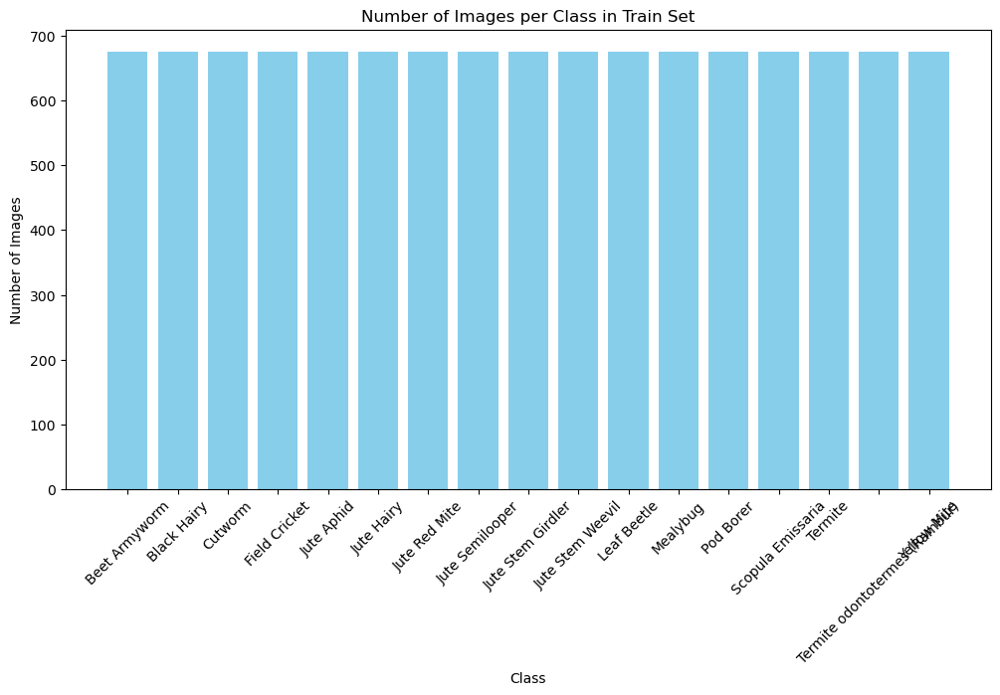

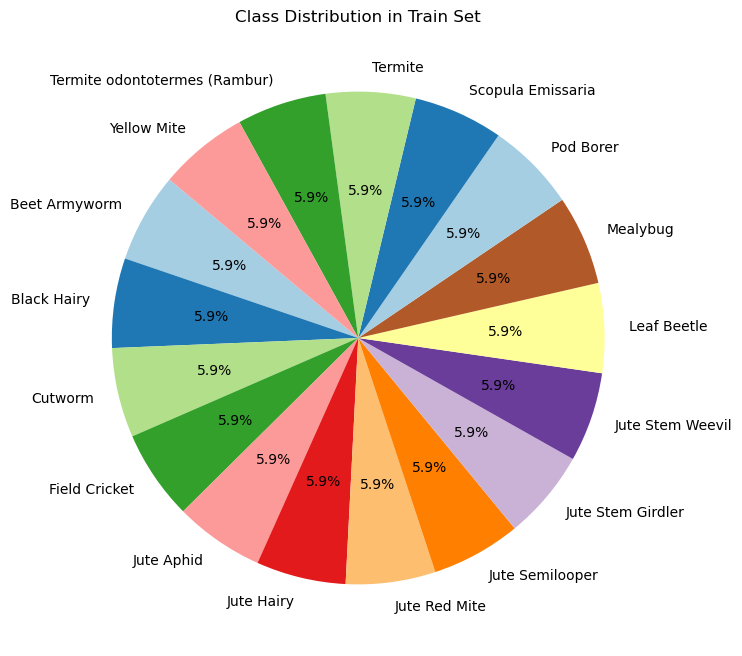


Image Properties Analysis:
All images have the same size: False
 - Image sizes: {(612, 612), (1435, 1003), (500, 444), (640, 457), (640, 640), (1016, 671), (1600, 902), (300, 300), (615, 409), (500, 300), (800, 784), (570, 395), (1200, 800), (572, 526), (500, 400), (259, 194), (612, 461), (800, 640), (1000, 750), (550, 550), (500, 357), (365, 138), (177, 286), (500, 375), (800, 505), (585, 800), (164, 306), (251, 201), (600, 400), (848, 566), (1743, 1308), (1024, 791), (800, 800), (1158, 880), (800, 571), (800, 516), (450, 339), (400, 320), (690, 430), (800, 537), (600, 466), (540, 360), (492, 375), (666, 411), (800, 500), (256, 256), (550, 300), (1200, 900), (806, 537), (1315, 1070), (600, 450), (224, 224), (1024, 768), (250, 188), (500, 500), (1024, 1024), (600, 971), (500, 420), (612, 408), (500, 365), (1299, 792), (450, 300), (274, 184), (1200, 630), (492, 800), (1280, 961), (909, 786), (760, 480), (277, 182), (612, 401), (970, 600), (1200, 1142), (800, 534), (800, 717), (800, 552

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Path to the dataset (Update this if needed)
dataset_path = "Jute_Pest_Dataset"
subset = "train"  # Only process the train subset

# Initialize variables
image_stats = {}
total_images = 0
image_sizes = set()
image_modes = set()

# Helper function to analyze the train folder
def analyze_folder(subset_path):
    class_counts = {}
    for class_name in sorted(os.listdir(subset_path)):  # Ensure consistent class order
        class_folder = os.path.join(subset_path, class_name)
        if os.path.isdir(class_folder):
            image_count = 0
            for image_name in os.listdir(class_folder):
                image_path = os.path.join(class_folder, image_name)
                try:
                    with Image.open(image_path) as img:
                        image_count += 1
                        image_sizes.add(img.size)
                        image_modes.add(img.mode)
                except Exception as e:
                    print(f"Skipping invalid image {image_path}: {e}")
            class_counts[class_name] = image_count
    return class_counts

# Analyze the train subset
subset_path = os.path.join(dataset_path, subset)
if os.path.exists(subset_path):
    image_stats = analyze_folder(subset_path)
    total_images = sum(image_stats.values())

# Plotting functions
def plot_bar_chart(data, title):
    plt.figure(figsize=(12, 6))
    plt.bar(data.keys(), data.values(), color='skyblue')
    plt.title(title)
    plt.xlabel("Class")
    plt.ylabel("Number of Images")
    plt.xticks(rotation=45)
    plt.show()

def plot_pie_chart(data, title):
    plt.figure(figsize=(8, 8))
    plt.pie(data.values(), labels=data.keys(), autopct='%1.1f%%', startangle=140, colors=plt.cm.Paired.colors)
    plt.title(title)
    plt.show()

# Summarize and visualize results
print(f"Analysis for Train Dataset:")
print(f" - Total Images in Train Set: {total_images}")

# Per-class analysis
if image_stats:
    print("\nTrain Set Class Distribution:")
    for class_name, count in image_stats.items():
        print(f"   - {class_name}: {count} images")
    plot_bar_chart(image_stats, "Number of Images per Class in Train Set")
    plot_pie_chart(image_stats, "Class Distribution in Train Set")

# Check image properties
print("\nImage Properties Analysis:")
print(f"All images have the same size: {len(image_sizes) == 1}")
if image_sizes:
    print(f" - Image sizes: {image_sizes}")
else:
    print(" - No valid images found.")

print(f"All images are Colored (RGB): {image_modes == {'RGB'}}")
print(f" - Image modes found: {image_modes}")

# Build and Train the Model

### Using ResNet18

d:\APPs\Anaconda\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\APPs\Anaconda\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/50], Time: 59.03s, Train Loss: 0.8094, Train Acc: 75.68%, Val Loss: 1.1101, Val Acc: 73.85%
Epoch [2/50], Time: 51.29s, Train Loss: 0.3583, Train Acc: 89.04%, Val Loss: 0.9155, Val Acc: 79.18%
Epoch [3/50], Time: 50.39s, Train Loss: 0.2227, Train Acc: 93.22%, Val Loss: 0.8200, Val Acc: 85.47%
Epoch [4/50], Time: 50.23s, Train Loss: 0.1898, Train Acc: 94.40%, Val Loss: 0.8796, Val Acc: 81.84%
Epoch [5/50], Time: 50.53s, Train Loss: 0.1633, Train Acc: 95.01%, Val Loss: 1.0383, Val Acc: 78.21%
Epoch [6/50], Time: 52.81s, Train Loss: 0.0850, Train Acc: 97.46%, Val Loss: 0.7446, Val Acc: 84.26%
Epoch [7/50], Time: 54.84s, Train Loss: 0.1098, Train Acc: 96.63%, Val Loss: 0.8317, Val Acc: 84.50%
Epoch [8/50], Time: 57.93s, Train Loss: 0.0917, Train Acc: 97.19%, Val Loss: 0.9064, Val Acc: 80.87%
Epoch [9/50], Time: 57.28s, Train Loss: 0.0928, Train Acc: 97.01%, Val Loss: 1.0162, Val Acc: 82.81%
Epoch [10/50], Time: 51.28s, Train Loss: 0.0686, Train Acc: 98.02%, Val Loss: 0.8133, Val A

C:\Users\BSM Computer\AppData\Local\Temp\ipykernel_21024\3745951294.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("Models/1.pth"))  

Test Accuracy: 90.77%


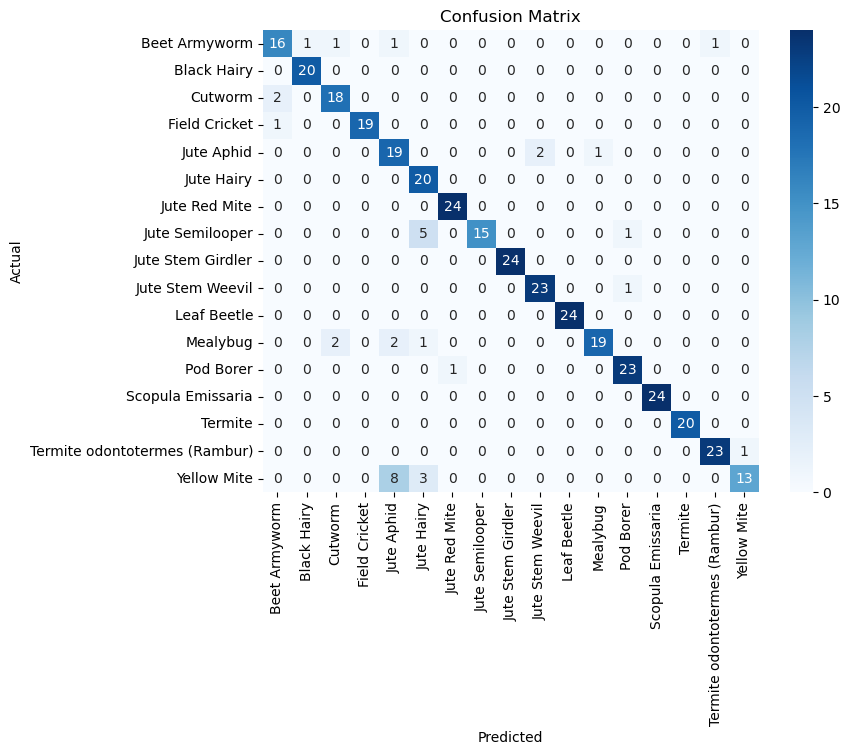

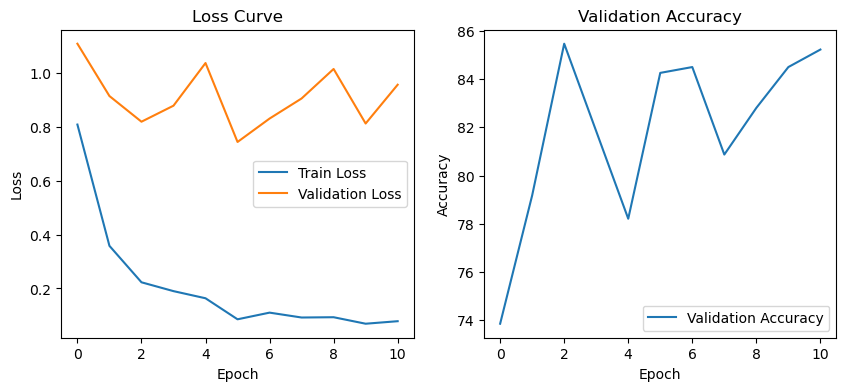

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.models as models
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import time
from sklearn.metrics import confusion_matrix

# === STEP 1: DATA PREPROCESSING ===
# Define transformations for training and validation
train_transforms = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize all images
    # transforms.RandomHorizontalFlip(p=0.5),  # Augmentation
    # transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

val_test_transforms = transforms.Compose([
    transforms.Resize((256, 256)),  
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

dataset_path = "Jute_Pest_Dataset"  # Change this to your dataset path

# Load datasets from separate train, validation, and test folders
train_dataset = ImageFolder(root=f"{dataset_path}/train", transform=train_transforms)
val_dataset = ImageFolder(root=f"{dataset_path}/val", transform=val_test_transforms)
test_dataset = ImageFolder(root=f"{dataset_path}/test", transform=val_test_transforms)

# Create DataLoaders
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# === STEP 2: MODEL CREATION ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = len(train_dataset.classes)  # Number of classes in dataset

# Use a pre-trained ResNet model
model = models.resnet18(pretrained=True)

# Modify the fully connected layer to match the number of classes
model.fc = nn.Linear(model.fc.in_features, num_classes)
model = model.to(device)

# Loss and Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Early stopping parameters
best_val_loss = float('inf')
patience = 5  # Stop if validation loss doesn't improve after 5 epochs
patience_counter = 0

# === STEP 3: TRAINING LOOP ===
num_epochs = 50
train_losses, val_losses, val_accuracies = [], [], []

for epoch in range(num_epochs):
    start_time = time.time()
    model.train()
    
    running_loss = 0.0
    correct = 0
    total = 0
    
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
    
    train_loss = running_loss / len(train_loader)
    train_acc = 100 * correct / total
    train_losses.append(train_loss)

    # Validation step
    model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()
    
    val_loss /= len(val_loader)
    val_losses.append(val_loss)
    val_acc = 100 * val_correct / val_total
    val_accuracies.append(val_acc)
    
    end_time = time.time()
    epoch_time = end_time - start_time

    print(f"Epoch [{epoch+1}/{num_epochs}], Time: {epoch_time:.2f}s, "
          f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}%, "
          f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.2f}%")

    # Early Stopping
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0
        torch.save(model.state_dict(), "Models/1.pth")  # Save best model
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping triggered.")
            break

# === STEP 4: TESTING & CONFUSION MATRIX ===
model.load_state_dict(torch.load("Models/1.pth"))  # Load best model
model.eval()
test_correct = 0
test_total = 0
all_preds, all_labels = [], []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        test_total += labels.size(0)
        test_correct += (predicted == labels).sum().item()
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

test_acc = 100 * test_correct / test_total
print(f"Test Accuracy: {test_acc:.2f}%")

# Plot confusion matrix
conf_matrix = confusion_matrix(all_labels, all_preds)
class_names = train_dataset.classes

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# === STEP 5: PLOTTING LOSS & ACCURACY ===
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.title("Loss Curve")

plt.subplot(1, 2, 2)
plt.plot(val_accuracies, label="Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.title("Validation Accuracy")
plt.show()

### Building Models From Scratch to reach the best structure

Epoch [1/50], Time: 48.43s, Train Loss: 2.6826, Train Acc: 14.94%, Val Loss: 2.3817, Val Acc: 23.24%
Epoch [2/50], Time: 50.42s, Train Loss: 2.4738, Train Acc: 18.04%, Val Loss: 2.1802, Val Acc: 32.69%
Epoch [3/50], Time: 51.86s, Train Loss: 2.3951, Train Acc: 20.50%, Val Loss: 2.1054, Val Acc: 29.06%
Epoch [4/50], Time: 50.13s, Train Loss: 2.3284, Train Acc: 22.27%, Val Loss: 2.0332, Val Acc: 39.23%
Epoch [5/50], Time: 50.13s, Train Loss: 2.2659, Train Acc: 24.53%, Val Loss: 2.0381, Val Acc: 29.78%
Epoch [6/50], Time: 50.58s, Train Loss: 2.1898, Train Acc: 25.58%, Val Loss: 1.8807, Val Acc: 36.32%
Epoch [7/50], Time: 48.94s, Train Loss: 2.1324, Train Acc: 27.58%, Val Loss: 1.7042, Val Acc: 47.46%
Epoch [8/50], Time: 48.67s, Train Loss: 2.0831, Train Acc: 30.01%, Val Loss: 1.7773, Val Acc: 42.86%
Epoch [9/50], Time: 49.10s, Train Loss: 2.0204, Train Acc: 31.47%, Val Loss: 1.7167, Val Acc: 43.34%
Epoch [10/50], Time: 49.59s, Train Loss: 1.9566, Train Acc: 33.96%, Val Loss: 1.6503, Val A

C:\Users\BSM Computer\AppData\Local\Temp\ipykernel_27232\3681140632.py:150: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("Models/2.pth"))


Test Accuracy: 74.93%


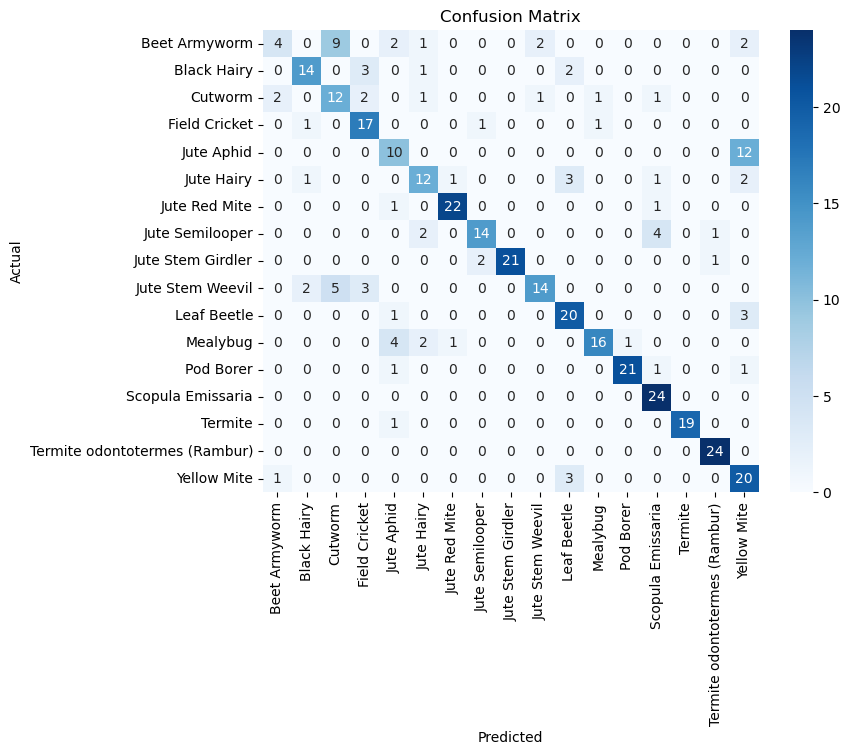

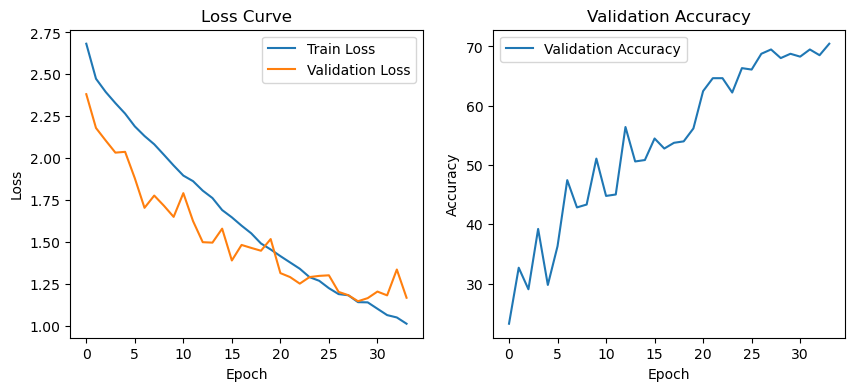

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import time
from sklearn.metrics import confusion_matrix

# === STEP 1: DATA PREPROCESSING ===
# Define transformations for training and validation
train_transforms = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize all images
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

val_test_transforms = transforms.Compose([
    transforms.Resize((256, 256)),  
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

dataset_path = "Jute_Pest_Dataset"  # Change this to your dataset path

# Load datasets from separate train, validation, and test folders
train_dataset = ImageFolder(root=f"{dataset_path}/train", transform=train_transforms)
val_dataset = ImageFolder(root=f"{dataset_path}/val", transform=val_test_transforms)
test_dataset = ImageFolder(root=f"{dataset_path}/test", transform=val_test_transforms)

# Create DataLoaders
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# === STEP 2: MODEL CREATION ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = len(train_dataset.classes)

# Define a custom CNN model
class CustomCNN(nn.Module):
    def __init__(self, num_classes):
        super(CustomCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=5, stride=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=5, stride=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, stride=1)
        self.bn4 = nn.BatchNorm2d(256)
        self.conv5 = nn.Conv2d(256, 512, kernel_size=3, stride=1)
        self.bn5 = nn.BatchNorm2d(512)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.fc1 = nn.Linear(512 * 5 * 5, 256)
        self.fc2 = nn.Linear(256, num_classes)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.5)

    def forward(self, x):
        x = self.pool(self.relu(self.bn1(self.conv1(x))))
        x = self.pool(self.relu(self.bn2(self.conv2(x))))
        x = self.pool(self.relu(self.bn3(self.conv3(x))))
        x = self.pool(self.relu(self.bn4(self.conv4(x))))
        x = self.pool(self.relu(self.bn5(self.conv5(x))))
        x = x.view( -1, 5 * 5 * 512)  # Flatten
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return F.log_softmax(x, dim=1)

model = CustomCNN(num_classes).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

best_val_loss = float('inf')
patience = 5
patience_counter = 0

# === STEP 3: TRAINING LOOP ===
num_epochs = 50
train_losses, val_losses, val_accuracies = [], [], []

for epoch in range(num_epochs):
    start_time = time.time()
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
    
    train_loss = running_loss / len(train_loader)
    train_acc = 100 * correct / total
    train_losses.append(train_loss)

    model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()
    
    val_loss /= len(val_loader)
    val_losses.append(val_loss)
    val_acc = 100 * val_correct / val_total
    val_accuracies.append(val_acc)
    
    end_time = time.time()
    print(f"Epoch [{epoch+1}/{num_epochs}], Time: {end_time - start_time:.2f}s, "
          f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}%, "
          f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.2f}%")
    
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0
        torch.save(model.state_dict(), "Models/2.pth")
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping triggered.")
            break

# === STEP 4: TESTING & CONFUSION MATRIX ===
model.load_state_dict(torch.load("Models/2.pth"))
model.eval()
test_correct = 0
test_total = 0
all_preds, all_labels = [], []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        test_total += labels.size(0)
        test_correct += (predicted == labels).sum().item()
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

test_acc = 100 * test_correct / test_total
print(f"Test Accuracy: {test_acc:.2f}%")

conf_matrix = confusion_matrix(all_labels, all_preds)
class_names = train_dataset.classes

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# === STEP 5: PLOTTING LOSS & ACCURACY ===
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.title("Loss Curve")

plt.subplot(1, 2, 2)
plt.plot(val_accuracies, label="Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.title("Validation Accuracy")
plt.show()

Epoch [1/50], Time: 54.95s, Train Loss: 2.1651, Train Acc: 30.77%, Val Loss: 2.0898, Val Acc: 33.17%
Epoch [2/50], Time: 54.19s, Train Loss: 1.6252, Train Acc: 47.87%, Val Loss: 1.5175, Val Acc: 53.51%
Epoch [3/50], Time: 51.20s, Train Loss: 1.2997, Train Acc: 58.24%, Val Loss: 1.7620, Val Acc: 54.96%
Epoch [4/50], Time: 53.16s, Train Loss: 1.0611, Train Acc: 65.99%, Val Loss: 1.4360, Val Acc: 57.63%
Epoch [5/50], Time: 51.12s, Train Loss: 0.8805, Train Acc: 71.87%, Val Loss: 1.3929, Val Acc: 54.96%
Epoch [6/50], Time: 51.22s, Train Loss: 0.7314, Train Acc: 76.61%, Val Loss: 1.2336, Val Acc: 67.07%
Epoch [7/50], Time: 50.74s, Train Loss: 0.6049, Train Acc: 80.66%, Val Loss: 1.3787, Val Acc: 69.73%
Epoch [8/50], Time: 49.36s, Train Loss: 0.4914, Train Acc: 84.33%, Val Loss: 1.4571, Val Acc: 66.83%
Epoch [9/50], Time: 49.35s, Train Loss: 0.4273, Train Acc: 86.62%, Val Loss: 1.4661, Val Acc: 70.22%
Epoch [10/50], Time: 49.64s, Train Loss: 0.3761, Train Acc: 88.39%, Val Loss: 1.1818, Val A

C:\Users\BSM Computer\AppData\Local\Temp\ipykernel_18240\1818639363.py:153: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("Models/3.pth"))


Test Accuracy: 85.22%


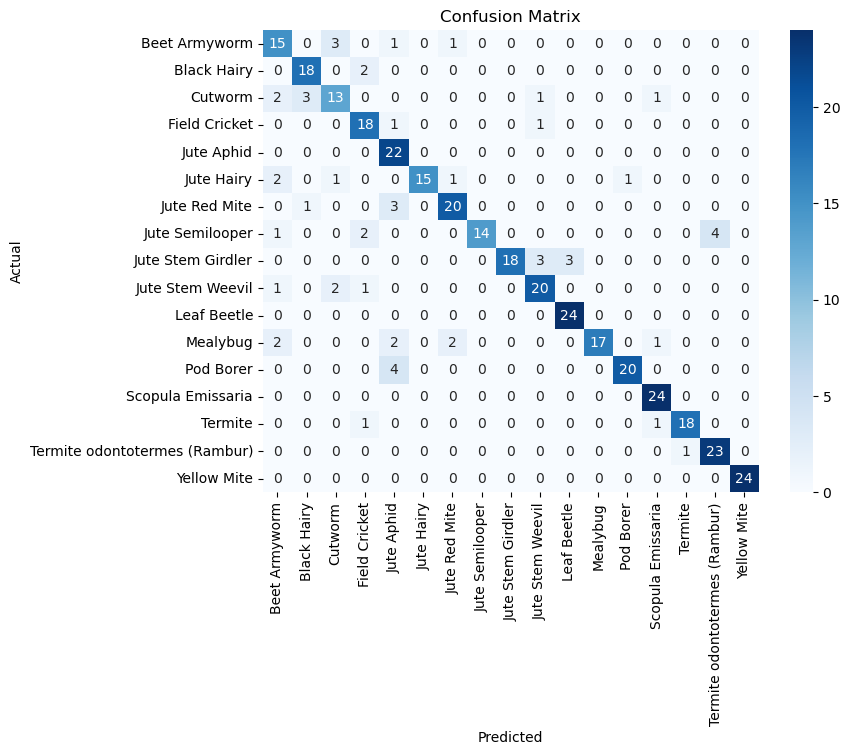

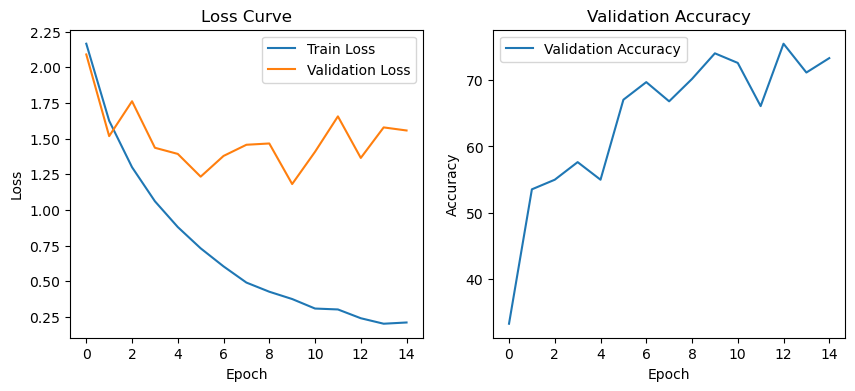

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import time
from sklearn.metrics import confusion_matrix

# === STEP 1: DATA PREPROCESSING ===
# Define transformations for training and validation
train_transforms = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize all images
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

val_test_transforms = transforms.Compose([
    transforms.Resize((256, 256)),  
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

dataset_path = "Jute_Pest_Dataset"  # Change this to your dataset path

# Load datasets from separate train, validation, and test folders
train_dataset = ImageFolder(root=f"{dataset_path}/train", transform=train_transforms)
val_dataset = ImageFolder(root=f"{dataset_path}/val", transform=val_test_transforms)
test_dataset = ImageFolder(root=f"{dataset_path}/test", transform=val_test_transforms)

# Create DataLoaders
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# === STEP 2: MODEL CREATION ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = len(train_dataset.classes)

# Define a custom CNN model
class CustomCNN(nn.Module):
    def __init__(self, num_classes):
        super(CustomCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=5, stride=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=5, stride=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, stride=1)
        self.bn4 = nn.BatchNorm2d(256)
        self.conv5 = nn.Conv2d(256, 512, kernel_size=5, stride=1)
        self.bn5 = nn.BatchNorm2d(512)
        self.conv6 = nn.Conv2d(512, 1024, kernel_size=3, stride=1)
        self.bn6 = nn.BatchNorm2d(1024)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.fc1 = nn.Linear(1024 * 1 * 1, 256)
        self.fc2 = nn.Linear(256, num_classes)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.4)

    def forward(self, x):
        x = self.pool(self.relu(self.bn1(self.conv1(x))))
        x = self.pool(self.relu(self.bn2(self.conv2(x))))
        x = self.pool(self.relu(self.bn3(self.conv3(x))))
        x = self.pool(self.relu(self.bn4(self.conv4(x))))
        x = self.pool(self.relu(self.bn5(self.conv5(x))))
        x = self.pool(self.relu(self.bn6(self.conv6(x))))
        x = x.view( -1, 1 * 1 * 1024)  # Flatten
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return F.log_softmax(x, dim=1)

model = CustomCNN(num_classes).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

best_val_loss = float('inf')
patience = 5
patience_counter = 0

# === STEP 3: TRAINING LOOP ===
num_epochs = 50
train_losses, val_losses, val_accuracies = [], [], []

for epoch in range(num_epochs):
    start_time = time.time()
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
    
    train_loss = running_loss / len(train_loader)
    train_acc = 100 * correct / total
    train_losses.append(train_loss)

    model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()
    
    val_loss /= len(val_loader)
    val_losses.append(val_loss)
    val_acc = 100 * val_correct / val_total
    val_accuracies.append(val_acc)
    
    end_time = time.time()
    print(f"Epoch [{epoch+1}/{num_epochs}], Time: {end_time - start_time:.2f}s, "
          f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}%, "
          f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.2f}%")
    
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0
        torch.save(model.state_dict(), "Models/3.pth")
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping triggered.")
            break

# === STEP 4: TESTING & CONFUSION MATRIX ===
model.load_state_dict(torch.load("Models/3.pth"))
model.eval()
test_correct = 0
test_total = 0
all_preds, all_labels = [], []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        test_total += labels.size(0)
        test_correct += (predicted == labels).sum().item()
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

test_acc = 100 * test_correct / test_total
print(f"Test Accuracy: {test_acc:.2f}%")

conf_matrix = confusion_matrix(all_labels, all_preds)
class_names = train_dataset.classes

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# === STEP 5: PLOTTING LOSS & ACCURACY ===
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.title("Loss Curve")

plt.subplot(1, 2, 2)
plt.plot(val_accuracies, label="Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.title("Validation Accuracy")
plt.show()

Epoch [1/50], Time: 47.63s, Train Loss: 2.4317, Train Acc: 22.77%, Val Loss: 1.9135, Val Acc: 37.29%
Epoch [2/50], Time: 47.45s, Train Loss: 2.0506, Train Acc: 33.57%, Val Loss: 1.7670, Val Acc: 42.86%
Epoch [3/50], Time: 49.10s, Train Loss: 1.8638, Train Acc: 38.81%, Val Loss: 1.7321, Val Acc: 45.52%
Epoch [4/50], Time: 47.58s, Train Loss: 1.7193, Train Acc: 43.18%, Val Loss: 1.6812, Val Acc: 46.49%
Epoch [5/50], Time: 47.48s, Train Loss: 1.5744, Train Acc: 47.87%, Val Loss: 1.6578, Val Acc: 48.18%
Epoch [6/50], Time: 47.62s, Train Loss: 1.4622, Train Acc: 51.76%, Val Loss: 1.3338, Val Acc: 58.60%
Epoch [7/50], Time: 48.98s, Train Loss: 1.3489, Train Acc: 56.19%, Val Loss: 1.3591, Val Acc: 60.53%
Epoch [8/50], Time: 49.14s, Train Loss: 1.2294, Train Acc: 59.66%, Val Loss: 1.2942, Val Acc: 63.44%
Epoch [9/50], Time: 48.06s, Train Loss: 1.1341, Train Acc: 62.63%, Val Loss: 1.2588, Val Acc: 61.74%
Epoch [10/50], Time: 48.59s, Train Loss: 1.0317, Train Acc: 65.37%, Val Loss: 1.3891, Val A

C:\Users\BSM Computer\AppData\Local\Temp\ipykernel_25576\505774727.py:153: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("Models/4.pth"))


Test Accuracy: 84.43%


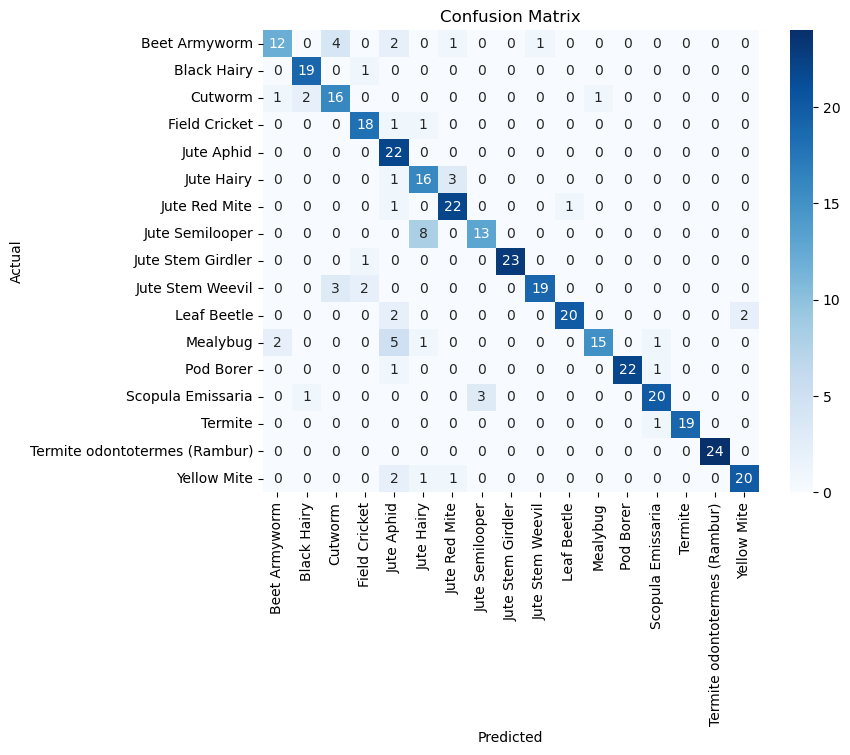

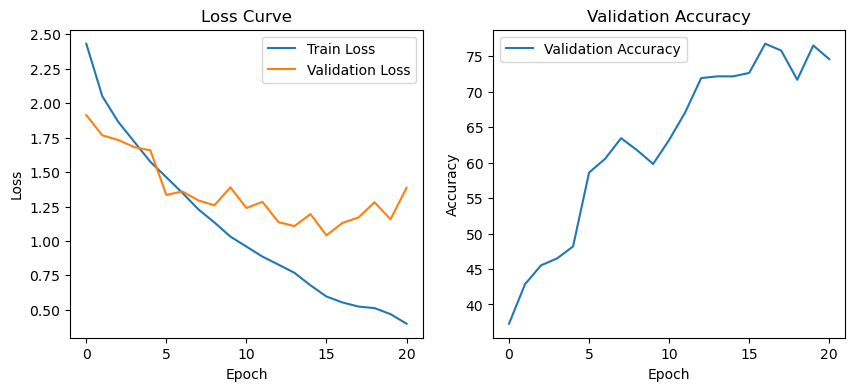

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import time
from sklearn.metrics import confusion_matrix

# === STEP 1: DATA PREPROCESSING ===
# Define transformations for training and validation
train_transforms = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize all images
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

val_test_transforms = transforms.Compose([
    transforms.Resize((256, 256)),  
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

dataset_path = "Jute_Pest_Dataset"  # Change this to your dataset path

# Load datasets from separate train, validation, and test folders
train_dataset = ImageFolder(root=f"{dataset_path}/train", transform=train_transforms)
val_dataset = ImageFolder(root=f"{dataset_path}/val", transform=val_test_transforms)
test_dataset = ImageFolder(root=f"{dataset_path}/test", transform=val_test_transforms)

# Create DataLoaders
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# === STEP 2: MODEL CREATION ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = len(train_dataset.classes)

# Define a custom CNN model
class CustomCNN(nn.Module):
    def __init__(self, num_classes):
        super(CustomCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, stride=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, stride=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, stride=1)
        self.bn4 = nn.BatchNorm2d(256)
        self.conv5 = nn.Conv2d(256, 512, kernel_size=3, stride=1)
        self.bn5 = nn.BatchNorm2d(512)
        self.conv6 = nn.Conv2d(512, 1024, kernel_size=3, stride=1)
        self.bn6 = nn.BatchNorm2d(1024)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.fc1 = nn.Linear(1024 * 2 * 2, 256)
        self.fc2 = nn.Linear(256, num_classes)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.5)

    def forward(self, x):
        x = self.pool(self.relu(self.bn1(self.conv1(x))))
        x = self.pool(self.relu(self.bn2(self.conv2(x))))
        x = self.pool(self.relu(self.bn3(self.conv3(x))))
        x = self.pool(self.relu(self.bn4(self.conv4(x))))
        x = self.pool(self.relu(self.bn5(self.conv5(x))))
        x = self.pool(self.relu(self.bn6(self.conv6(x))))
        x = x.view( -1, 2 * 2 * 1024)  # Flatten
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return F.log_softmax(x, dim=1)

model = CustomCNN(num_classes).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

best_val_loss = float('inf')
patience = 5
patience_counter = 0

# === STEP 3: TRAINING LOOP ===
num_epochs = 50
train_losses, val_losses, val_accuracies = [], [], []

for epoch in range(num_epochs):
    start_time = time.time()
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
    
    train_loss = running_loss / len(train_loader)
    train_acc = 100 * correct / total
    train_losses.append(train_loss)

    model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()
    
    val_loss /= len(val_loader)
    val_losses.append(val_loss)
    val_acc = 100 * val_correct / val_total
    val_accuracies.append(val_acc)
    
    end_time = time.time()
    print(f"Epoch [{epoch+1}/{num_epochs}], Time: {end_time - start_time:.2f}s, "
          f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}%, "
          f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.2f}%")
    
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0
        torch.save(model.state_dict(), "Models/4.pth")
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping triggered.")
            break

# === STEP 4: TESTING & CONFUSION MATRIX ===
model.load_state_dict(torch.load("Models/4.pth"))
model.eval()
test_correct = 0
test_total = 0
all_preds, all_labels = [], []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        test_total += labels.size(0)
        test_correct += (predicted == labels).sum().item()
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

test_acc = 100 * test_correct / test_total
print(f"Test Accuracy: {test_acc:.2f}%")

conf_matrix = confusion_matrix(all_labels, all_preds)
class_names = train_dataset.classes

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# === STEP 5: PLOTTING LOSS & ACCURACY ===
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.title("Loss Curve")

plt.subplot(1, 2, 2)
plt.plot(val_accuracies, label="Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.title("Validation Accuracy")
plt.show()

Epoch [1/50], Time: 59.11s, Train Loss: 2.1450, Train Acc: 31.99%, Val Loss: 1.8283, Val Acc: 39.23%
Epoch [2/50], Time: 55.70s, Train Loss: 1.5938, Train Acc: 48.86%, Val Loss: 1.6009, Val Acc: 51.57%
Epoch [3/50], Time: 54.05s, Train Loss: 1.3086, Train Acc: 57.85%, Val Loss: 1.4362, Val Acc: 59.81%
Epoch [4/50], Time: 53.86s, Train Loss: 1.0958, Train Acc: 64.74%, Val Loss: 1.3600, Val Acc: 59.81%
Epoch [5/50], Time: 54.09s, Train Loss: 0.9059, Train Acc: 70.54%, Val Loss: 1.3935, Val Acc: 67.80%
Epoch [6/50], Time: 57.40s, Train Loss: 0.7742, Train Acc: 75.00%, Val Loss: 1.2648, Val Acc: 65.86%
Epoch [7/50], Time: 55.11s, Train Loss: 0.6406, Train Acc: 79.21%, Val Loss: 1.2627, Val Acc: 66.83%
Epoch [8/50], Time: 57.65s, Train Loss: 0.5252, Train Acc: 83.23%, Val Loss: 1.3233, Val Acc: 70.22%
Epoch [9/50], Time: 57.07s, Train Loss: 0.4913, Train Acc: 84.49%, Val Loss: 1.2233, Val Acc: 73.61%
Epoch [10/50], Time: 56.78s, Train Loss: 0.4102, Train Acc: 86.96%, Val Loss: 1.2074, Val A

C:\Users\BSM Computer\AppData\Local\Temp\ipykernel_22564\3506708937.py:153: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("Models/5.pth"))


Test Accuracy: 77.31%


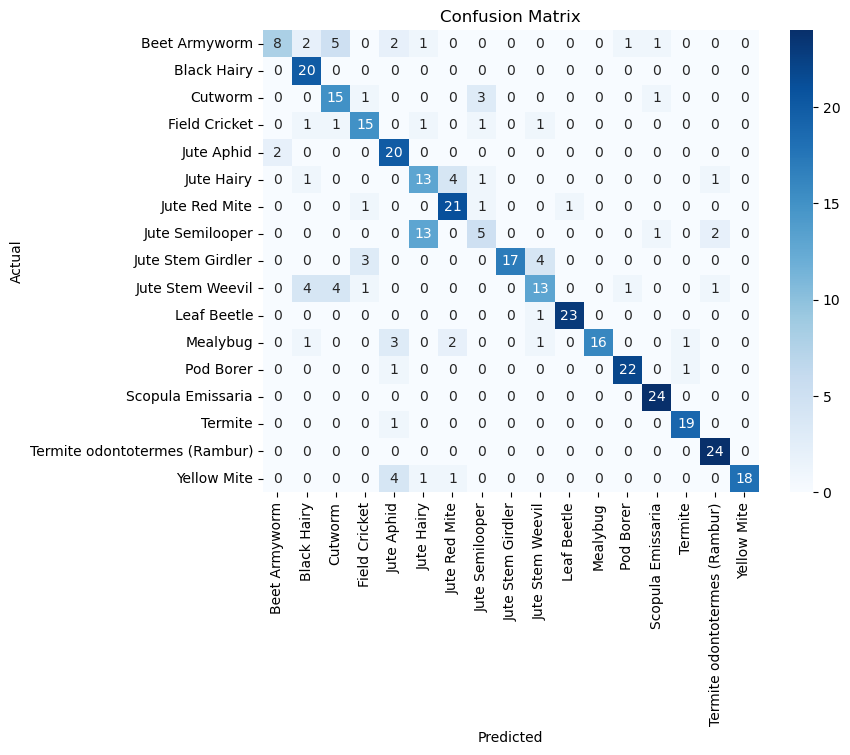

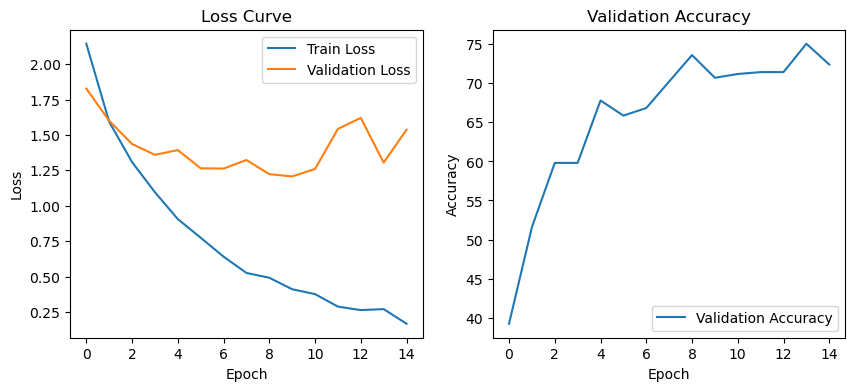

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import time
from sklearn.metrics import confusion_matrix

# === STEP 1: DATA PREPROCESSING ===
# Define transformations for training and validation
train_transforms = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize all images
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

val_test_transforms = transforms.Compose([
    transforms.Resize((256, 256)),  
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

dataset_path = "Jute_Pest_Dataset"  # Change this to your dataset path

# Load datasets from separate train, validation, and test folders
train_dataset = ImageFolder(root=f"{dataset_path}/train", transform=train_transforms)
val_dataset = ImageFolder(root=f"{dataset_path}/val", transform=val_test_transforms)
test_dataset = ImageFolder(root=f"{dataset_path}/test", transform=val_test_transforms)

# Create DataLoaders
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# === STEP 2: MODEL CREATION ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = len(train_dataset.classes)

# Define a custom CNN model
class CustomCNN(nn.Module):
    def __init__(self, num_classes):
        super(CustomCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, stride=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=5, stride=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, stride=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=5, stride=1)
        self.bn4 = nn.BatchNorm2d(256)
        self.conv5 = nn.Conv2d(256, 512, kernel_size=3, stride=1)
        self.bn5 = nn.BatchNorm2d(512)
        self.conv6 = nn.Conv2d(512, 1024, kernel_size=3, stride=1)
        self.bn6 = nn.BatchNorm2d(1024)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.fc1 = nn.Linear(1024 * 1 * 1, 256)
        self.fc2 = nn.Linear(256, num_classes)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.4)

    def forward(self, x):
        x = self.pool(self.relu(self.bn1(self.conv1(x))))
        x = self.pool(self.relu(self.bn2(self.conv2(x))))
        x = self.pool(self.relu(self.bn3(self.conv3(x))))
        x = self.pool(self.relu(self.bn4(self.conv4(x))))
        x = self.pool(self.relu(self.bn5(self.conv5(x))))
        x = self.pool(self.relu(self.bn6(self.conv6(x))))
        x = x.view( -1, 1 * 1 * 1024)  # Flatten
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return F.log_softmax(x, dim=1)

model = CustomCNN(num_classes).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

best_val_loss = float('inf')
patience = 5
patience_counter = 0

# === STEP 3: TRAINING LOOP ===
num_epochs = 50
train_losses, val_losses, val_accuracies = [], [], []

for epoch in range(num_epochs):
    start_time = time.time()
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
    
    train_loss = running_loss / len(train_loader)
    train_acc = 100 * correct / total
    train_losses.append(train_loss)

    model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()
    
    val_loss /= len(val_loader)
    val_losses.append(val_loss)
    val_acc = 100 * val_correct / val_total
    val_accuracies.append(val_acc)
    
    end_time = time.time()
    print(f"Epoch [{epoch+1}/{num_epochs}], Time: {end_time - start_time:.2f}s, "
          f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}%, "
          f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.2f}%")
    
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0
        torch.save(model.state_dict(), "Models/5.pth")
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping triggered.")
            break

# === STEP 4: TESTING & CONFUSION MATRIX ===
model.load_state_dict(torch.load("Models/5.pth"))
model.eval()
test_correct = 0
test_total = 0
all_preds, all_labels = [], []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        test_total += labels.size(0)
        test_correct += (predicted == labels).sum().item()
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

test_acc = 100 * test_correct / test_total
print(f"Test Accuracy: {test_acc:.2f}%")

conf_matrix = confusion_matrix(all_labels, all_preds)
class_names = train_dataset.classes

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# === STEP 5: PLOTTING LOSS & ACCURACY ===
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.title("Loss Curve")

plt.subplot(1, 2, 2)
plt.plot(val_accuracies, label="Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.title("Validation Accuracy")
plt.show()

Epoch [1/50], Time: 50.74s, Train Loss: 2.2569, Train Acc: 27.29%, Val Loss: 1.9219, Val Acc: 38.01%
Epoch [2/50], Time: 55.17s, Train Loss: 1.7707, Train Acc: 43.17%, Val Loss: 1.7860, Val Acc: 45.28%
Epoch [3/50], Time: 53.60s, Train Loss: 1.4650, Train Acc: 52.92%, Val Loss: 1.6833, Val Acc: 49.15%
Epoch [4/50], Time: 50.67s, Train Loss: 1.2494, Train Acc: 59.93%, Val Loss: 1.2774, Val Acc: 57.63%
Epoch [5/50], Time: 50.19s, Train Loss: 1.0739, Train Acc: 65.58%, Val Loss: 1.3658, Val Acc: 60.77%
Epoch [6/50], Time: 50.60s, Train Loss: 0.9266, Train Acc: 70.25%, Val Loss: 1.1713, Val Acc: 67.07%
Epoch [7/50], Time: 50.31s, Train Loss: 0.8112, Train Acc: 74.06%, Val Loss: 1.1415, Val Acc: 67.80%
Epoch [8/50], Time: 50.00s, Train Loss: 0.6969, Train Acc: 77.97%, Val Loss: 1.0559, Val Acc: 70.94%
Epoch [9/50], Time: 50.65s, Train Loss: 0.6165, Train Acc: 81.18%, Val Loss: 1.4066, Val Acc: 67.07%
Epoch [10/50], Time: 50.15s, Train Loss: 0.5831, Train Acc: 81.56%, Val Loss: 1.3226, Val A

C:\Users\BSM Computer\AppData\Local\Temp\ipykernel_14788\3082152392.py:156: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("Models/6.pth"))


Test Accuracy: 73.09%


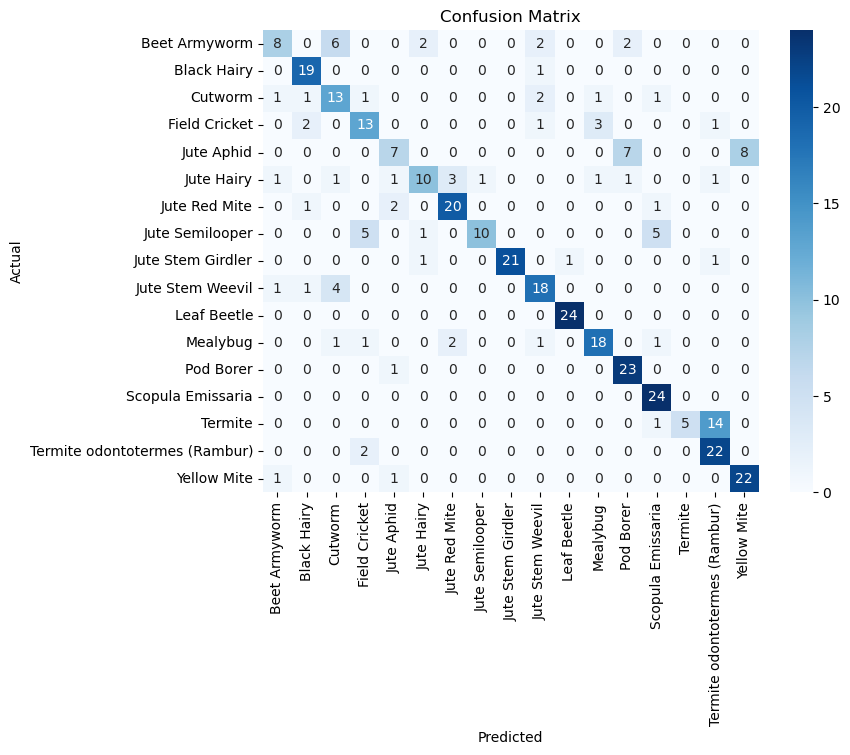

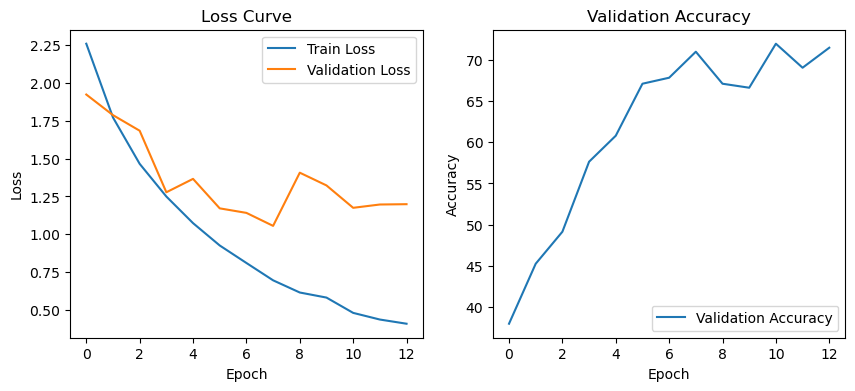

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import time
from sklearn.metrics import confusion_matrix

# === STEP 1: DATA PREPROCESSING ===
# Define transformations for training and validation
train_transforms = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize all images
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

val_test_transforms = transforms.Compose([
    transforms.Resize((256, 256)),  
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

dataset_path = "Jute_Pest_Dataset"  # Change this to your dataset path

# Load datasets from separate train, validation, and test folders
train_dataset = ImageFolder(root=f"{dataset_path}/train", transform=train_transforms)
val_dataset = ImageFolder(root=f"{dataset_path}/val", transform=val_test_transforms)
test_dataset = ImageFolder(root=f"{dataset_path}/test", transform=val_test_transforms)

# Create DataLoaders
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# === STEP 2: MODEL CREATION ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = len(train_dataset.classes)

# Define a custom CNN model
class CustomCNN(nn.Module):
    def __init__(self, num_classes):
        super(CustomCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=5, stride=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=5, stride=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, stride=1)
        self.bn4 = nn.BatchNorm2d(256)
        self.conv5 = nn.Conv2d(256, 512, kernel_size=5, stride=1)
        self.bn5 = nn.BatchNorm2d(512)
        self.conv6 = nn.Conv2d(512, 1024, kernel_size=3, stride=1)
        self.bn6 = nn.BatchNorm2d(1024)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.fc1 = nn.Linear(1024 * 1 * 1, 256)
        self.fc2 = nn.Linear(256, num_classes)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.4)

    def forward(self, x):
        x = self.pool(self.relu(self.bn1(self.conv1(x))))
        x = self.pool(self.relu(self.bn2(self.conv2(x))))
        x = self.pool(self.relu(self.bn3(self.conv3(x))))
        x = self.pool(self.relu(self.bn4(self.conv4(x))))
        x = self.pool(self.relu(self.bn5(self.conv5(x))))
        x = self.pool(self.relu(self.bn6(self.conv6(x))))
        x = x.view( -1, 1 * 1 * 1024)  # Flatten
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return F.log_softmax(x, dim=1)

model = CustomCNN(num_classes).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

best_val_loss = float('inf')
patience = 5
patience_counter = 0

# === STEP 3: TRAINING LOOP ===
num_epochs = 50
train_losses, val_losses, val_accuracies = [], [], []

for epoch in range(num_epochs):
    start_time = time.time()
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
    
    train_loss = running_loss / len(train_loader)
    train_acc = 100 * correct / total
    train_losses.append(train_loss)

    model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()
    
    val_loss /= len(val_loader)
    val_losses.append(val_loss)
    val_acc = 100 * val_correct / val_total
    val_accuracies.append(val_acc)
    
    end_time = time.time()
    print(f"Epoch [{epoch+1}/{num_epochs}], Time: {end_time - start_time:.2f}s, "
          f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}%, "
          f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.2f}%")
    
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0
        torch.save(model.state_dict(), "Models/6.pth")
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping triggered.")
            break

# === STEP 4: TESTING & CONFUSION MATRIX ===
model.load_state_dict(torch.load("Models/6.pth"))
model.eval()
test_correct = 0
test_total = 0
all_preds, all_labels = [], []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        test_total += labels.size(0)
        test_correct += (predicted == labels).sum().item()
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

test_acc = 100 * test_correct / test_total
print(f"Test Accuracy: {test_acc:.2f}%")

conf_matrix = confusion_matrix(all_labels, all_preds)
class_names = train_dataset.classes

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# === STEP 5: PLOTTING LOSS & ACCURACY ===
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.title("Loss Curve")

plt.subplot(1, 2, 2)
plt.plot(val_accuracies, label="Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.title("Validation Accuracy")
plt.show()

### Load pre-trained ResNet18 and modify final layer

d:\APPs\Anaconda\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\APPs\Anaconda\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/50], Time: 49.77s, Train Loss: 1.3162, Train Acc: 59.72%, Val Loss: 1.5476, Val Acc: 69.73%
Epoch [2/50], Time: 46.71s, Train Loss: 0.8723, Train Acc: 72.73%, Val Loss: 1.0336, Val Acc: 75.06%
Epoch [3/50], Time: 44.42s, Train Loss: 0.6632, Train Acc: 79.56%, Val Loss: 1.0378, Val Acc: 75.06%
Epoch [4/50], Time: 44.21s, Train Loss: 0.5814, Train Acc: 82.08%, Val Loss: 0.7535, Val Acc: 81.11%
Epoch [5/50], Time: 44.38s, Train Loss: 0.5261, Train Acc: 83.87%, Val Loss: 1.0445, Val Acc: 75.79%
Epoch [6/50], Time: 44.51s, Train Loss: 0.4898, Train Acc: 85.13%, Val Loss: 0.8481, Val Acc: 82.57%
Epoch [7/50], Time: 45.55s, Train Loss: 0.4248, Train Acc: 86.93%, Val Loss: 0.9421, Val Acc: 78.69%
Epoch [8/50], Time: 44.35s, Train Loss: 0.4163, Train Acc: 87.37%, Val Loss: 0.8851, Val Acc: 81.60%
Epoch [9/50], Time: 44.31s, Train Loss: 0.3892, Train Acc: 87.71%, Val Loss: 0.8762, Val Acc: 83.05%
Early stopping triggered.


C:\Users\BSM Computer\AppData\Local\Temp\ipykernel_27172\3013887597.py:127: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("Models/7.pth"))


Test Accuracy: 91.56%


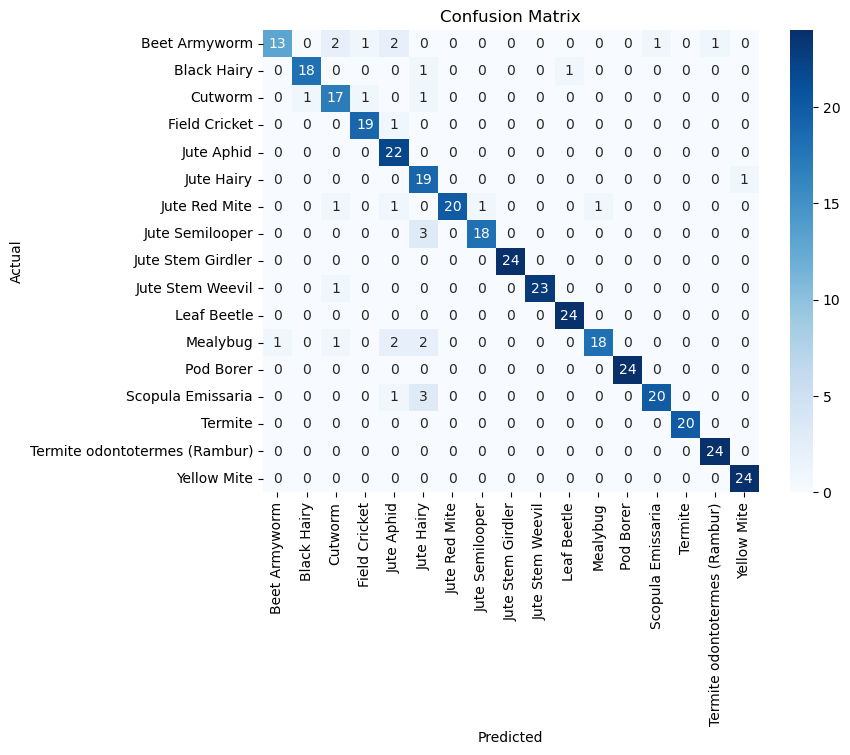

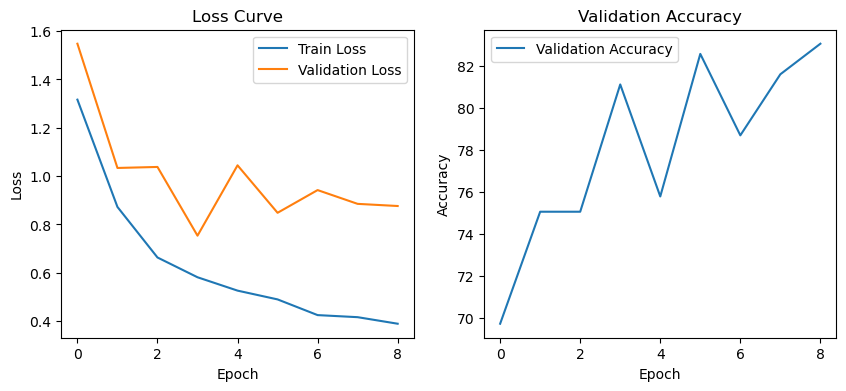

In [1]:
## ResNet18 with Scratch
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import time
from sklearn.metrics import confusion_matrix
from torchvision import models

# === STEP 1: DATA PREPROCESSING ===
# Define transformations for training and validation with ResNet-appropriate normalization
train_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_test_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

dataset_path = "Jute_Pest_Dataset"  # Change this to your dataset path

# Load datasets from separate train, validation, and test folders
train_dataset = ImageFolder(root=f"{dataset_path}/train", transform=train_transforms)
val_dataset = ImageFolder(root=f"{dataset_path}/val", transform=val_test_transforms)
test_dataset = ImageFolder(root=f"{dataset_path}/test", transform=val_test_transforms)

# Create DataLoaders
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# === STEP 2: MODEL CREATION ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = len(train_dataset.classes)

# Load pre-trained ResNet18 and modify final layer
model = models.resnet18(pretrained=True)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, num_classes)
model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

best_val_loss = float('inf')
patience = 5
patience_counter = 0

# === STEP 3: TRAINING LOOP ===
num_epochs = 50
train_losses, val_losses, val_accuracies = [], [], []

for epoch in range(num_epochs):
    start_time = time.time()
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
    
    train_loss = running_loss / len(train_loader)
    train_acc = 100 * correct / total
    train_losses.append(train_loss)

    model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()
    
    val_loss /= len(val_loader)
    val_losses.append(val_loss)
    val_acc = 100 * val_correct / val_total
    val_accuracies.append(val_acc)
    
    end_time = time.time()
    print(f"Epoch [{epoch+1}/{num_epochs}], Time: {end_time - start_time:.2f}s, "
          f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}%, "
          f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.2f}%")
    
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0
        torch.save(model.state_dict(), "Models/7.pth")
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping triggered.")
            break

# === STEP 4: TESTING & CONFUSION MATRIX ===
model.load_state_dict(torch.load("Models/7.pth"))
model.eval()
test_correct = 0
test_total = 0
all_preds, all_labels = [], []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        test_total += labels.size(0)
        test_correct += (predicted == labels).sum().item()
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

test_acc = 100 * test_correct / test_total
print(f"Test Accuracy: {test_acc:.2f}%")

conf_matrix = confusion_matrix(all_labels, all_preds)
class_names = train_dataset.classes

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# === STEP 5: PLOTTING LOSS & ACCURACY ===
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.title("Loss Curve")

plt.subplot(1, 2, 2)
plt.plot(val_accuracies, label="Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.title("Validation Accuracy")
plt.show()

### Ensemble Model 1(Resnet18) and Model 3(From Scratch)

C:\Users\BSM Computer\AppData\Local\Temp\ipykernel_13308\1818766471.py:86: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  custom_model.load_state_dict(torch.load("Models/3.pt


Ensemble Test Accuracy: 94.99%

Classification Report:

                               precision    recall  f1-score   support

                Beet Armyworm       0.85      0.85      0.85        20
                  Black Hairy       0.91      1.00      0.95        20
                      Cutworm       0.89      0.85      0.87        20
                Field Cricket       0.95      1.00      0.98        20
                   Jute Aphid       0.81      1.00      0.90        22
                   Jute Hairy       0.91      1.00      0.95        20
                Jute Red Mite       0.88      0.96      0.92        24
              Jute Semilooper       1.00      0.86      0.92        21
            Jute Stem Girdler       1.00      1.00      1.00        24
             Jute Stem Weevil       1.00      0.96      0.98        24
                  Leaf Beetle       1.00      1.00      1.00        24
                     Mealybug       1.00      0.79      0.88        24
                   

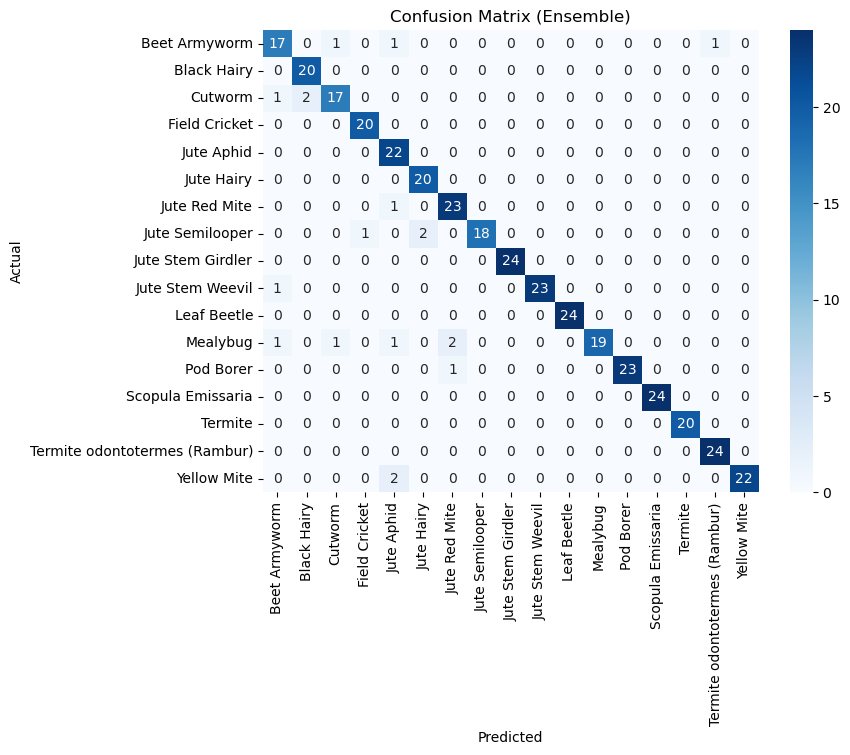

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms as transforms
import torchvision.models as models
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import time
from sklearn.metrics import confusion_matrix, classification_report

# === STEP 1: DATA PREPROCESSING ===
train_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

val_test_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

dataset_path = "Jute_Pest_Dataset"  # Change this to your dataset path
train_dataset = ImageFolder(root=f"{dataset_path}/train", transform=train_transforms)
val_dataset = ImageFolder(root=f"{dataset_path}/val", transform=val_test_transforms)
test_dataset = ImageFolder(root=f"{dataset_path}/test", transform=val_test_transforms)

batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# === STEP 2: MODEL DEFINITIONS ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = len(train_dataset.classes)

# Custom CNN Model (corrected to output raw logits)
class CustomCNN(nn.Module):
    def __init__(self, num_classes):
        super(CustomCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=5, stride=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=5, stride=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, stride=1)
        self.bn4 = nn.BatchNorm2d(256)
        self.conv5 = nn.Conv2d(256, 512, kernel_size=5, stride=1)
        self.bn5 = nn.BatchNorm2d(512)
        self.conv6 = nn.Conv2d(512, 1024, kernel_size=3, stride=1)
        self.bn6 = nn.BatchNorm2d(1024)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.fc1 = nn.Linear(1024 * 1 * 1, 256)
        self.fc2 = nn.Linear(256, num_classes)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.4)

    def forward(self, x):
        x = self.pool(self.relu(self.bn1(self.conv1(x))))
        x = self.pool(self.relu(self.bn2(self.conv2(x))))
        x = self.pool(self.relu(self.bn3(self.conv3(x))))
        x = self.pool(self.relu(self.bn4(self.conv4(x))))
        x = self.pool(self.relu(self.bn5(self.conv5(x))))
        x = self.pool(self.relu(self.bn6(self.conv6(x))))
        x = x.view(-1, 1024 * 1 * 1)
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x  # Raw logits

# ResNet18 Model
resnet_model = models.resnet18(pretrained=True)
resnet_model.fc = nn.Linear(resnet_model.fc.in_features, num_classes)

# Instantiate models
custom_model = CustomCNN(num_classes).to(device)
resnet_model = resnet_model.to(device)

# === STEP 4: ENSEMBLE TESTING ===
custom_model.load_state_dict(torch.load("Models/3.pth"))
resnet_model.load_state_dict(torch.load("Models/1.pth"))
custom_model.eval()
resnet_model.eval()

all_preds, all_labels = [], []
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs_custom = custom_model(images)
        outputs_resnet = resnet_model(images)
        probs_custom = F.softmax(outputs_custom, dim=1)
        probs_resnet = F.softmax(outputs_resnet, dim=1)
        avg_probs = (probs_custom + probs_resnet) / 2
        _, predicted = torch.max(avg_probs, 1)
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

test_acc = 100 * (np.array(all_preds) == np.array(all_labels)).sum() / len(all_labels)
print(f"\nEnsemble Test Accuracy: {test_acc:.2f}%")

class_names = train_dataset.classes
# Generate classification report
report = classification_report(all_labels, all_preds, target_names=class_names)
print("\nClassification Report:\n")
print(report)

# Plot confusion matrix
conf_matrix = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix (Ensemble)")
plt.show()

### Ensemble Model 1(Resnet18) and Model 7(edited ResNet18 last layer)

d:\APPs\Anaconda\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\APPs\Anaconda\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
C:\Users\BSM Computer\AppData\Local\Temp\ipykernel_24256\302903505.py:48: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#unt


Ensemble Test Accuracy: 70.71%

Classification Report:

                               precision    recall  f1-score   support

                Beet Armyworm       1.00      0.50      0.67        20
                  Black Hairy       0.91      0.50      0.65        20
                      Cutworm       0.92      0.55      0.69        20
                Field Cricket       0.92      0.60      0.73        20
                   Jute Aphid       0.61      0.86      0.72        22
                   Jute Hairy       0.38      1.00      0.56        20
                Jute Red Mite       1.00      0.75      0.86        24
              Jute Semilooper       0.80      0.19      0.31        21
            Jute Stem Girdler       1.00      1.00      1.00        24
             Jute Stem Weevil       1.00      0.83      0.91        24
                  Leaf Beetle       0.96      1.00      0.98        24
                     Mealybug       0.49      0.96      0.65        24
                   

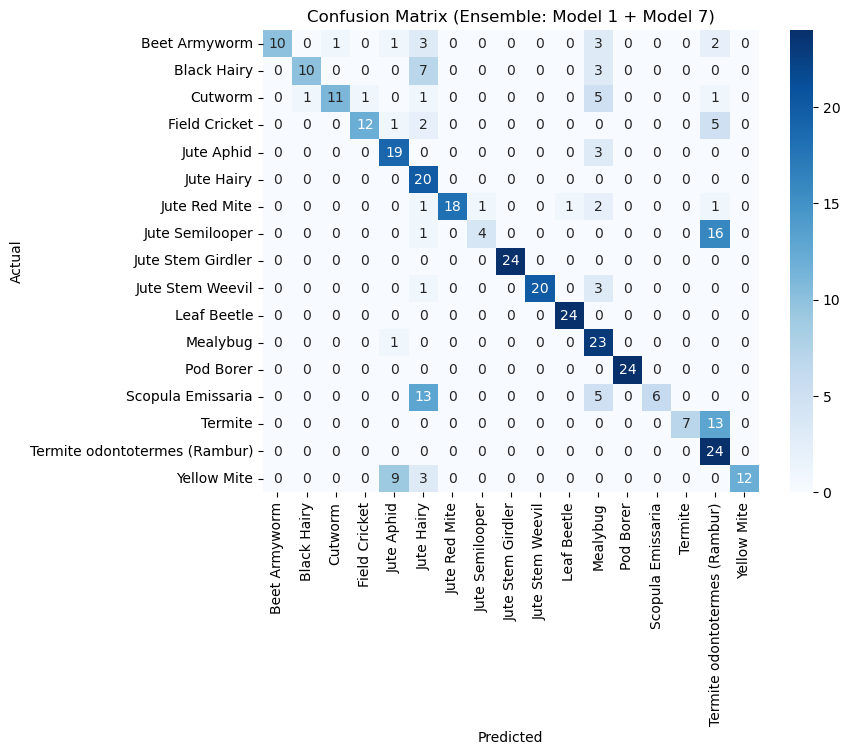

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
import torchvision.models as models
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# === STEP 1: DATA PREPROCESSING ===
# Define transformations (using ImageNet normalization for ResNet compatibility)
train_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_test_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

dataset_path = "Jute_Pest_Dataset"  # Adjust to your dataset path
train_dataset = ImageFolder(root=f"{dataset_path}/train", transform=train_transforms)
val_dataset = ImageFolder(root=f"{dataset_path}/val", transform=val_test_transforms)
test_dataset = ImageFolder(root=f"{dataset_path}/test", transform=val_test_transforms)

# Create DataLoaders
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# === STEP 2: MODEL DEFINITIONS ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = len(train_dataset.classes)

# Model 1: ResNet18 fine-tuned from pre-trained weights
model1 = models.resnet18(pretrained=True)
model1.fc = nn.Linear(model1.fc.in_features, num_classes)
model1.load_state_dict(torch.load("Models/1.pth"))
model1 = model1.to(device)
model1.eval()

# Model 7: ResNet18 trained from scratch
model7 = models.resnet18(pretrained=False)
model7.fc = nn.Linear(model7.fc.in_features, num_classes)
model7.load_state_dict(torch.load("Models/7.pth"))
model7 = model7.to(device)
model7.eval()

# === STEP 3: ENSEMBLE TESTING ===
all_preds, all_labels = [], []
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs1 = model1(images)
        outputs7 = model7(images)
        probs1 = F.softmax(outputs1, dim=1)
        probs7 = F.softmax(outputs7, dim=1)
        avg_probs = (probs1 + probs7) / 2
        _, predicted = torch.max(avg_probs, 1)
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Calculate test accuracy
test_acc = 100 * (np.array(all_preds) == np.array(all_labels)).sum() / len(all_labels)
print(f"\nEnsemble Test Accuracy: {test_acc:.2f}%")

# Class names for reporting
class_names = test_dataset.classes

# Generate classification report
report = classification_report(all_labels, all_preds, target_names=class_names)
print("\nClassification Report:\n")
print(report)

# Plot confusion matrix
conf_matrix = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix (Ensemble: Model 1 + Model 7)")
plt.show()

### Ensemble Model 3(From Scratch) and Model 7(edited ResNet18 last layer)

d:\APPs\Anaconda\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\APPs\Anaconda\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
C:\Users\BSM Computer\AppData\Local\Temp\ipykernel_24256\2234104691.py:67: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `Tr


Ensemble Test Accuracy: 86.54%


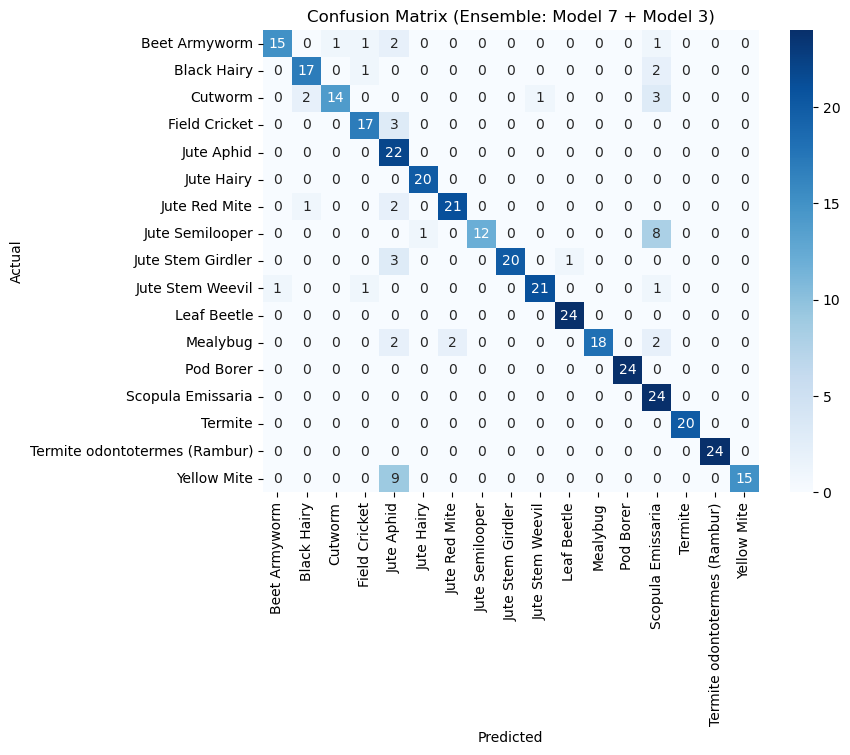

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# === STEP 1: DATA PREPROCESSING ===
# Define test transformations (consistent with training)
test_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

dataset_path = "Jute_Pest_Dataset"  # Adjust to your dataset path
test_dataset = ImageFolder(root=f"{dataset_path}/test", transform=test_transforms)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=4)

# === STEP 2: MODEL DEFINITIONS ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = len(test_dataset.classes)

# Define the CustomCNN class (Model 3) as in your code
class CustomCNN(nn.Module):
    def __init__(self, num_classes):
        super(CustomCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=5, stride=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=5, stride=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, stride=1)
        self.bn4 = nn.BatchNorm2d(256)
        self.conv5 = nn.Conv2d(256, 512, kernel_size=5, stride=1)
        self.bn5 = nn.BatchNorm2d(512)
        self.conv6 = nn.Conv2d(512, 1024, kernel_size=3, stride=1)
        self.bn6 = nn.BatchNorm2d(1024)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.fc1 = nn.Linear(1024 * 1 * 1, 256)
        self.fc2 = nn.Linear(256, num_classes)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.4)

    def forward(self, x):
        x = self.pool(self.relu(self.bn1(self.conv1(x))))
        x = self.pool(self.relu(self.bn2(self.conv2(x))))
        x = self.pool(self.relu(self.bn3(self.conv3(x))))
        x = self.pool(self.relu(self.bn4(self.conv4(x))))
        x = self.pool(self.relu(self.bn5(self.conv5(x))))
        x = self.pool(self.relu(self.bn6(self.conv6(x))))
        x = x.view(-1, 1024 * 1 * 1)  # Flatten
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x  # Raw logits (note: your original returns log_softmax, but we'll use logits here)

# Load Model 7: ResNet18 trained from scratch
model7 = models.resnet18(pretrained=False)
model7.fc = nn.Linear(model7.fc.in_features, num_classes)
model7.load_state_dict(torch.load("Models/7.pth"))
model7 = model7.to(device)
model7.eval()

# Load Model 3: Custom CNN
model3 = CustomCNN(num_classes)
model3.load_state_dict(torch.load("Models/3.pth"))
model3 = model3.to(device)
model3.eval()

# === STEP 3: ENSEMBLE TESTING ===
all_preds, all_labels = [], []
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        # Get predictions from both models
        outputs7 = model7(images)
        outputs3 = model3(images)
        # Convert logits to probabilities
        probs7 = F.softmax(outputs7, dim=1)
        probs3 = F.softmax(outputs3, dim=1)
        # Average the probabilities
        avg_probs = (probs7 + probs3) / 2
        # Get the predicted class
        _, predicted = torch.max(avg_probs, 1)
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Calculate accuracy
test_acc = 100 * (np.array(all_preds) == np.array(all_labels)).sum() / len(all_labels)
print(f"\nEnsemble Test Accuracy: {test_acc:.2f}%")

# === STEP 4: PLOT CONFUSION MATRIX ===
conf_matrix = confusion_matrix(all_labels, all_preds)
class_names = test_dataset.classes

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix (Ensemble: Model 7 + Model 3)")
plt.show()

### Saving and Using the Ensemble(Model 1&3) as a Single Model

#### Define the Ensemble Model Class

In [3]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class EnsembleModel(nn.Module):
    def __init__(self, custom_model, resnet_model):
        super(EnsembleModel, self).__init__()
        self.custom_model = custom_model
        self.resnet_model = resnet_model

    def forward(self, x):
        # Get raw logits from both models
        outputs_custom = self.custom_model(x)
        outputs_resnet = self.resnet_model(x)
        # Compute softmax probabilities
        probs_custom = F.softmax(outputs_custom, dim=1)
        probs_resnet = F.softmax(outputs_resnet, dim=1)
        # Average the probabilities
        avg_probs = (probs_custom + probs_resnet) / 2
        return avg_probs

#### Integrate into Your Code

d:\APPs\Anaconda\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\APPs\Anaconda\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
C:\Users\BSM Computer\AppData\Local\Temp\ipykernel_24256\1193307674.py:86: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#un

Ensemble model saved as 'ensemble_model.pt'

Ensemble Test Accuracy: 94.99%

Classification Report:

                               precision    recall  f1-score   support

                Beet Armyworm       0.85      0.85      0.85        20
                  Black Hairy       0.91      1.00      0.95        20
                      Cutworm       0.89      0.85      0.87        20
                Field Cricket       0.95      1.00      0.98        20
                   Jute Aphid       0.81      1.00      0.90        22
                   Jute Hairy       0.91      1.00      0.95        20
                Jute Red Mite       0.88      0.96      0.92        24
              Jute Semilooper       1.00      0.86      0.92        21
            Jute Stem Girdler       1.00      1.00      1.00        24
             Jute Stem Weevil       1.00      0.96      0.98        24
                  Leaf Beetle       1.00      1.00      1.00        24
                     Mealybug       1.00      

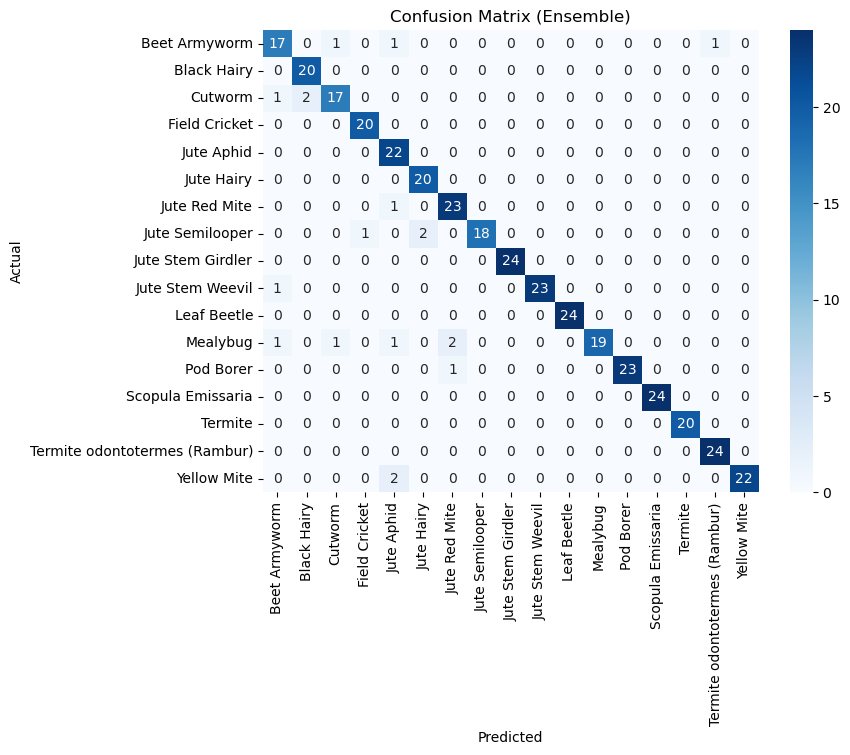

In [4]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms as transforms
import torchvision.models as models
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import time
from sklearn.metrics import confusion_matrix, classification_report

# === STEP 1: DATA PREPROCESSING ===
train_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

val_test_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

dataset_path = "Jute_Pest_Dataset"  # Change this to your dataset path
train_dataset = ImageFolder(root=f"{dataset_path}/train", transform=train_transforms)
val_dataset = ImageFolder(root=f"{dataset_path}/val", transform=val_test_transforms)
test_dataset = ImageFolder(root=f"{dataset_path}/test", transform=val_test_transforms)

batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# === STEP 2: MODEL DEFINITIONS ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = len(train_dataset.classes)

# Custom CNN Model (corrected to output raw logits)
class CustomCNN(nn.Module):
    def __init__(self, num_classes):
        super(CustomCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=5, stride=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=5, stride=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, stride=1)
        self.bn4 = nn.BatchNorm2d(256)
        self.conv5 = nn.Conv2d(256, 512, kernel_size=5, stride=1)
        self.bn5 = nn.BatchNorm2d(512)
        self.conv6 = nn.Conv2d(512, 1024, kernel_size=3, stride=1)
        self.bn6 = nn.BatchNorm2d(1024)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.fc1 = nn.Linear(1024 * 1 * 1, 256)
        self.fc2 = nn.Linear(256, num_classes)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.4)

    def forward(self, x):
        x = self.pool(self.relu(self.bn1(self.conv1(x))))
        x = self.pool(self.relu(self.bn2(self.conv2(x))))
        x = self.pool(self.relu(self.bn3(self.conv3(x))))
        x = self.pool(self.relu(self.bn4(self.conv4(x))))
        x = self.pool(self.relu(self.bn5(self.conv5(x))))
        x = self.pool(self.relu(self.bn6(self.conv6(x))))
        x = x.view(-1, 1024 * 1 * 1)
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x  # Raw logits

# ResNet18 Model
resnet_model = models.resnet18(pretrained=True)
resnet_model.fc = nn.Linear(resnet_model.fc.in_features, num_classes)

# Instantiate models
custom_model = CustomCNN(num_classes).to(device)
resnet_model = resnet_model.to(device)

# === LOAD TRAINED MODELS ===
custom_model.load_state_dict(torch.load("Models/3.pth"))
resnet_model.load_state_dict(torch.load("Models/1.pth"))
custom_model.eval()
resnet_model.eval()

# === DEFINE AND SAVE ENSEMBLE MODEL ===
class EnsembleModel(nn.Module):
    def __init__(self, custom_model, resnet_model):
        super(EnsembleModel, self).__init__()
        self.custom_model = custom_model
        self.resnet_model = resnet_model

    def forward(self, x):
        outputs_custom = self.custom_model(x)
        outputs_resnet = self.resnet_model(x)
        probs_custom = F.softmax(outputs_custom, dim=1)
        probs_resnet = F.softmax(outputs_resnet, dim=1)
        avg_probs = (probs_custom + probs_resnet) / 2
        return avg_probs

# Create the ensemble model
ensemble_model = EnsembleModel(custom_model, resnet_model)

# Save the ensemble model using TorchScript
scripted_ensemble = torch.jit.script(ensemble_model)
scripted_ensemble.save("ensemble_model.pt")
print("Ensemble model saved as 'ensemble_model.pt'")

# === STEP 4: ENSEMBLE TESTING ===
all_preds, all_labels = [], []
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        # Use the ensemble model directly
        avg_probs = ensemble_model(images)
        _, predicted = torch.max(avg_probs, 1)
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

test_acc = 100 * (np.array(all_preds) == np.array(all_labels)).sum() / len(all_labels)
print(f"\nEnsemble Test Accuracy: {test_acc:.2f}%")

class_names = train_dataset.classes
# Generate classification report
report = classification_report(all_labels, all_preds, target_names=class_names)
print("\nClassification Report:\n")
print(report)

# Plot confusion matrix
conf_matrix = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix (Ensemble)")
plt.show()

#### Using the Saved Ensemble Model Later

In [5]:
import torch
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder

# Define the same transforms used during testing
val_test_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

# Load your test dataset
dataset_path = "Jute_Pest_Dataset"  # Change this to your dataset path
test_dataset = ImageFolder(root=f"{dataset_path}/test", transform=val_test_transforms)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=4)

# Load the saved ensemble model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
loaded_ensemble = torch.jit.load("ensemble_model.pt")
loaded_ensemble = loaded_ensemble.to(device)
loaded_ensemble.eval()

# Perform inference
all_preds, all_labels = [], []
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        avg_probs = loaded_ensemble(images)  # Get averaged probabilities
        _, predicted = torch.max(avg_probs, 1)
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Calculate accuracy
test_acc = 100 * (np.array(all_preds) == np.array(all_labels)).sum() / len(all_labels)
print(f"Loaded Ensemble Test Accuracy: {test_acc:.2f}%")

Loaded Ensemble Test Accuracy: 94.99%


---

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
from torchvision import transforms, datasets
import numpy as np

# Define constants
IMG_SIZE = 256  # Image size (48x48)
BATCH_SIZE = 32
EPOCHS = 50
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

dataset_path = "Jute_Pest_Dataset"  # Change this to your dataset path

# Data augmentation equivalent to ImageDataGenerator
transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),  # Resize images
    transforms.ToTensor(),  # Convert to tensor Make the image pixel values between [0, 1]
    transforms.Normalize((0.5,), (0.5,))  # Normalize pixel values in [-1,1]
])

# Load datasets from separate train, validation, and test folders
train_dataset = ImageFolder(root=f"{dataset_path}/train", transform=transform)
val_dataset = ImageFolder(root=f"{dataset_path}/val", transform=transform)
test_dataset = ImageFolder(root=f"{dataset_path}/test", transform=transform)

# Datasets and DataLoaders
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=8, pin_memory=True)
validation_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=8, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

# Output class mapping for categorical labels
class_names = train_dataset.classes
print(f"Class names: {class_names}")

# Example usage: Iterate through the data loader
for images, labels in train_loader:
    print(f"Batch size: {images.size()} Labels: {labels.size()}")
    break

Class names: ['Beet Armyworm', 'Black Hairy', 'Cutworm', 'Field Cricket', 'Jute Aphid', 'Jute Hairy', 'Jute Red Mite', 'Jute Semilooper', 'Jute Stem Girdler', 'Jute Stem Weevil', 'Leaf Beetle', 'Mealybug', 'Pod Borer', 'Scopula Emissaria', 'Termite', 'Termite odontotermes (Rambur)', 'Yellow Mite']
Batch size: torch.Size([32, 3, 256, 256]) Labels: torch.Size([32])


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch.backends.cudnn as cudnn
from torch.utils.tensorboard import SummaryWriter
from tensorboard.plugins.hparams import api as hp
from torch.cuda.amp import autocast, GradScaler
import numpy as np

# Enable optimized CuDNN
cudnn.benchmark = True  

# Enable Mixed Precision
scaler = GradScaler()

# Define Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print('Using device:', device)

# Define Hyperparameters and Their Ranges
HP_FILTER_SIZE = hp.HParam('filter_size', hp.Discrete([3, 5]))
HP_FILTER_NUMBER = hp.HParam('filter_number', hp.Discrete([50, 64, 32]))

METRIC_ACCURACY = 'accuracy'

# TensorBoard setup
with SummaryWriter('logs_1/hparam_tuning') as writer:
    hp.hparams_config(
        hparams=[HP_FILTER_SIZE, HP_FILTER_NUMBER],
        metrics=[hp.Metric(METRIC_ACCURACY, display_name='Accuracy')],
    )

Using device: cuda


C:\Users\BSM Computer\AppData\Local\Temp\ipykernel_23648\2093573693.py:15: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()


In [ ]:
# Define CNN Architecture
class SimpleCNN(nn.Module):
    def __init__(self, filter_size_1, filter_size_2, filter_number_1, filter_number_2, num_classes=17):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, filter_number_1, filter_size_1)
        self.conv2 = nn.Conv2d(filter_number_1, filter_number_2, filter_size_2)
        self.pool = nn.MaxPool2d(2, 2)

        # Compute output size dynamically
        if filter_size_1 == 3 and filter_size_2 == 3:
            output_size = ((48 - 2) // 2)  
            output_size = ((output_size - 2) // 2)

        elif filter_size_1 == 3 and filter_size_2 == 5:
            output_size = ((48 - 2) // 2)  
            output_size = ((output_size - 4) // 2)

        elif filter_size_1 == 5 and filter_size_2 == 3:
            output_size = ((48 - 4) // 2)  
            output_size = ((output_size - 2) // 2)

        else:
            output_size = ((48 - 4) // 2)  
            output_size = ((output_size - 4) // 2)

        self.output_size = output_size  # Store for use in forward()
        self.filter_number_2 = filter_number_2  # Store for flattening

        self.fc1 = nn.Linear(filter_number_2 * output_size * output_size, 512)
        self.fc2 = nn.Linear(512, num_classes)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        # batch_size = x.size(0)
        # x = x.view(batch_size, -1)  # Flatten dynamically
        x = x.view( -1, self.filter_number_2 * self.output_size * self.output_size)  # Flatten
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return F.log_softmax(x, dim=1)

In [ ]:
# Training and Validation
def train_test_model(hparams, device):
    model = SimpleCNN(hparams["filter_size_1"], hparams["filter_size_2"], hparams["filter_number_1"], hparams["filter_number_2"], num_classes=17).to(device)
    
    # Loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    
    # TensorBoard writer
    writer = SummaryWriter(log_dir='Logs_1/Model_1')
    
    # Early stopping parameters
    best_val_loss = np.inf
    best_epoch = 0
    early_stopping_counter = 0
    patience = 3
    epochs = 50
    
    for epoch in range(epochs):
        model.train()
        running_loss, correct, total = 0.0, 0, 0

        # Training loop
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
        
        train_accuracy = 100. * correct / total
        train_loss = running_loss / len(train_loader)

        # Validation loop
        model.eval()
        val_loss, val_correct, val_total = 0.0, 0, 0
        with torch.no_grad():
            for images, labels in validation_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item()
                _, predicted = outputs.max(1)
                val_total += labels.size(0)
                val_correct += predicted.eq(labels).sum().item()
        
        val_accuracy = 100. * val_correct / val_total
        val_loss /= len(validation_loader)
        
        # Print epoch results
        print(f"Epoch [{epoch + 1}/{epochs}], Train Loss: {train_loss:.4f}, Train Acc: {train_accuracy:.2f}%, "
              f"Val Loss: {val_loss:.4f}, Val Acc: {val_accuracy:.2f}%")
        
        # Log to TensorBoard
        writer.add_scalar('Loss/Train', train_loss, epoch + 1)
        writer.add_scalar('Loss/Validation', val_loss, epoch + 1)
        writer.add_scalar('Accuracy/Train', train_accuracy, epoch + 1)
        writer.add_scalar('Accuracy/Validation', val_accuracy, epoch + 1)

        # Early stopping logic
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_epoch = epoch
            early_stopping_counter = 0
            # torch.save(model.state_dict(), 'best_model_22.pth')  # Save the best model
        else:
            early_stopping_counter += 1
            if early_stopping_counter >= patience:
                print(f"Early stopping at epoch {epoch + 1}. Best epoch: {best_epoch + 1}")
                break
    
    writer.close()
    print("Training complete.")
    
    # Evaluate model
    model.eval()
    test_correct, test_total = 0, 0
    with torch.no_grad():
        for images, labels in validation_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = outputs.max(1)
            test_total += labels.size(0)
            test_correct += predicted.eq(labels).sum().item()
    
    test_accuracy = 100. * test_correct / test_total
    print(f"Test Accuracy: {test_accuracy:.2f}%")
    return test_accuracy

In [ ]:
# Log Results
def run(log_dir, hparams, device):
    with SummaryWriter(log_dir) as writer:
        hp.hparams(hparams)  
        accuracy = train_test_model(hparams, device)
        writer.add_scalar(METRIC_ACCURACY, accuracy, global_step=1)

In [ ]:
# Perform Grid Search
session_num = 0
print('Using device:', device)

for filter_size_1 in HP_FILTER_SIZE.domain.values:
    for filter_number_1 in HP_FILTER_NUMBER.domain.values:
        for filter_size_2 in HP_FILTER_SIZE.domain.values:  # Fixed loop
            for filter_number_2 in HP_FILTER_NUMBER.domain.values:
                hparams = {
                    "filter_size_1": filter_size_1,
                    "filter_size_2": filter_size_2,  # Corrected key
                    "filter_number_1": filter_number_1,
                    "filter_number_2": filter_number_2
                }
                run_name = f"run-{session_num}"
                print(f'--- Starting trial: {run_name}')
                print({h: hparams[h] for h in hparams})
                run(f'logs_1/hparam_tuning/{run_name}', hparams, device)
                session_num += 1

Using device: cuda
--- Starting trial: run-0
{'filter_size_1': 3, 'filter_size_2': 3, 'filter_number_1': 32, 'filter_number_2': 32}


RuntimeError: shape '[-1, 3200]' is invalid for input of size 3936256

## efficientnet_b3

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.models as models
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import time
from sklearn.metrics import confusion_matrix
import os

# === STEP 1: DATA PREPROCESSING ===
train_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

val_test_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

# Use the absolute path to the dataset
dataset_path = "D:/Telegram Downloads/Old Materials/Fourth Year First Term/Neural Networks and Deep Learning/Jute_Pest_Notebooks/NoteBook 1/Jute_Pest_Dataset"

# Custom ImageFolder to skip missing files
class SafeImageFolder(ImageFolder):
    def __getitem__(self, index):
        path, target = self.samples[index]
        if not os.path.exists(path):
            print(f"Skipping missing file: {path}")
            return None
        return super().__getitem__(index)

# Custom collate function to filter out None entries
def collate_fn(batch):
    batch = [item for item in batch if item is not None]
    if len(batch) == 0:
        # Return dummy data to avoid DataLoader crash
        return torch.zeros(1), torch.zeros(1, dtype=torch.long)
    return torch.utils.data.dataloader.default_collate(batch)

train_dataset = SafeImageFolder(root=f"{dataset_path}/train", transform=train_transforms)
val_dataset = SafeImageFolder(root=f"{dataset_path}/val", transform=val_test_transforms)
test_dataset = SafeImageFolder(root=f"{dataset_path}/test", transform=val_test_transforms)

batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4, collate_fn=collate_fn)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4, collate_fn=collate_fn)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4, collate_fn=collate_fn)

# === STEP 2: MODEL CREATION ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = len(train_dataset.classes)

# Use EfficientNet-B3
model = models.efficientnet_b3(pretrained=True)
model.classifier = nn.Linear(model.classifier[1].in_features, num_classes)
model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

best_val_loss = float('inf')
patience = 5
patience_counter = 0

# === STEP 3: TRAINING LOOP ===
num_epochs = 50
train_losses, val_losses, val_accuracies = [], [], []

for epoch in range(num_epochs):
    start_time = time.time()
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    
    for images, labels in train_loader:
        # Skip batches that are empty or dummy
        if images.size(0) == 1 and images.sum() == 0:
            continue
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
    
    train_loss = running_loss / len(train_loader)
    train_acc = 100 * correct / total if total > 0 else 0
    train_losses.append(train_loss)

    model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    with torch.no_grad():
        for images, labels in val_loader:
            if images.size(0) == 1 and images.sum() == 0:
                continue
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()
    
    val_loss /= len(val_loader)
    val_losses.append(val_loss)
    val_acc = 100 * val_correct / val_total if val_total > 0 else 0
    val_accuracies.append(val_acc)
    
    end_time = time.time()
    epoch_time = end_time - start_time
    print(f"Epoch [{epoch+1}/{num_epochs}], Time: {epoch_time:.2f}s, "
          f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}%, "
          f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.2f}%")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0
        torch.save(model.state_dict(), "Models/efficientnet_b3.pth")
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping triggered.")
            break

# === STEP 4: TESTING & CONFUSION MATRIX ===
model = models.efficientnet_b3(pretrained=False)
model.classifier = nn.Linear(model.classifier[1].in_features, num_classes)
model.load_state_dict(torch.load("Models/efficientnet_b3.pth"))
model = model.to(device)
model.eval()

test_correct = 0
test_total = 0
all_preds, all_labels = [], []
with torch.no_grad():
    for images, labels in test_loader:
        if images.size(0) == 1 and images.sum() == 0:
            continue
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        test_total += labels.size(0)
        test_correct += (predicted == labels).sum().item()
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

test_acc = 100 * test_correct / test_total if test_total > 0 else 0
print(f"Test Accuracy: {test_acc:.2f}%")

conf_matrix = confusion_matrix(all_labels, all_preds)
class_names = train_dataset.classes
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# === STEP 5: PLOTTING LOSS & ACCURACY ===
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.title("Loss Curve")
plt.subplot(1, 2, 2)
plt.plot(val_accuracies, label="Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.title("Validation Accuracy")
plt.show()

d:\APPs\Anaconda\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\APPs\Anaconda\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B3_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


# Integrating the two ensembeled models(From balaneced & imbalanced dataset)

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class SuperEnsembleModel(nn.Module):
    def __init__(self, ensemble_balanced, ensemble_imbalanced):
        super(SuperEnsembleModel, self).__init__()
        self.ensemble_balanced = ensemble_balanced
        self.ensemble_imbalanced = ensemble_imbalanced

    def forward(self, x):
        # Get averaged probabilities from both ensemble models
        probs_balanced = self.ensemble_balanced(x)
        probs_imbalanced = self.ensemble_imbalanced(x)
        # Average the probabilities
        avg_probs = (probs_balanced + probs_imbalanced) / 2
        return avg_probs

Super ensemble model saved as 'super_ensemble_model.pt'

Super Ensemble Test Accuracy: 97.89%

Classification Report:

                               precision    recall  f1-score   support

                Beet Armyworm       0.89      0.85      0.87        20
                  Black Hairy       0.95      1.00      0.98        20
                      Cutworm       0.95      0.90      0.92        20
                Field Cricket       1.00      1.00      1.00        20
                   Jute Aphid       0.92      1.00      0.96        22
                   Jute Hairy       0.95      1.00      0.98        20
                Jute Red Mite       1.00      0.96      0.98        24
              Jute Semilooper       1.00      0.95      0.98        21
            Jute Stem Girdler       1.00      1.00      1.00        24
             Jute Stem Weevil       1.00      1.00      1.00        24
                  Leaf Beetle       1.00      1.00      1.00        24
                     Mealybu

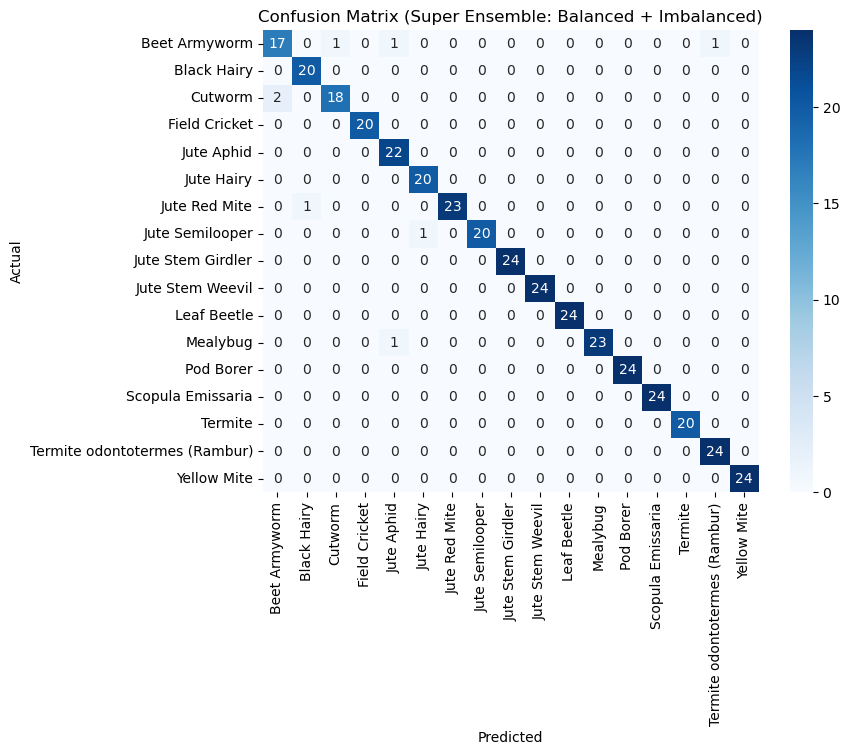

In [5]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
import torchvision.models as models
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
import os

# === STEP 1: DATA PREPROCESSING ===
val_test_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

# Use the absolute path to the dataset (update as needed)
dataset_path = "D:/Telegram Downloads/Old Materials/Fourth Year First Term/Neural Networks and Deep Learning/Jute_Pest_Notebooks/NoteBook 1/Jute_Pest_Dataset"
test_dataset = ImageFolder(root=f"{dataset_path}/test", transform=val_test_transforms)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=4)

# === STEP 2: LOAD THE TWO ENSEMBLE MODELS ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load the ensemble trained on the balanced dataset
ensemble_balanced = torch.jit.load("ensemble_model.pt")
ensemble_balanced = ensemble_balanced.to(device)
ensemble_balanced.eval()

# Load the ensemble trained on the imbalanced dataset
ensemble_imbalanced_path = os.path.join("..", "NoteBook 2", "ensemble_model.pt")
ensemble_imbalanced = torch.jit.load(ensemble_imbalanced_path)
ensemble_imbalanced = ensemble_imbalanced.to(device)
ensemble_imbalanced.eval()

# === STEP 3: DEFINE THE SUPER ENSEMBLE MODEL ===
class SuperEnsembleModel(nn.Module):
    def __init__(self, ensemble_balanced, ensemble_imbalanced):
        super(SuperEnsembleModel, self).__init__()
        self.ensemble_balanced = ensemble_balanced
        self.ensemble_imbalanced = ensemble_imbalanced

    def forward(self, x):
        probs_balanced = self.ensemble_balanced(x)
        probs_imbalanced = self.ensemble_imbalanced(x)
        avg_probs = (probs_balanced + probs_imbalanced) / 2
        return avg_probs

# Create the super ensemble model
super_ensemble = SuperEnsembleModel(ensemble_balanced, ensemble_imbalanced)
super_ensemble = super_ensemble.to(device)

# Optionally, save the super ensemble model
scripted_super_ensemble = torch.jit.script(super_ensemble)
scripted_super_ensemble.save("super_ensemble_model.pt")
print("Super ensemble model saved as 'super_ensemble_model.pt'")

# === STEP 4: EVALUATE THE SUPER ENSEMBLE ===
all_preds, all_labels = [], []
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        # Get predictions from the super ensemble
        avg_probs = super_ensemble(images)
        _, predicted = torch.max(avg_probs, 1)
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Calculate accuracy
test_acc = 100 * (np.array(all_preds) == np.array(all_labels)).sum() / len(all_labels)
print(f"\nSuper Ensemble Test Accuracy: {test_acc:.2f}%")

# Generate classification report
class_names = test_dataset.classes
report = classification_report(all_labels, all_preds, target_names=class_names)
print("\nClassification Report:\n")
print(report)

# Plot confusion matrix
conf_matrix = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix (Super Ensemble: Balanced + Imbalanced)")
plt.show()

## Making predictions using the super ensemble model

Predicted Class: Jute Semilooper
Confidence: 0.7503 (or 75.03%)


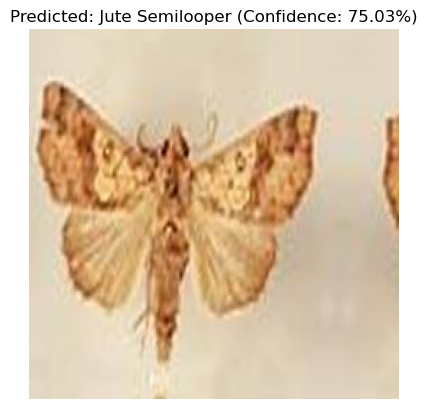


Test Accuracy: 97.89%
Sample 1: Predicted: Beet Armyworm (Confidence: 74.86%), True: Beet Armyworm
Sample 2: Predicted: Beet Armyworm (Confidence: 90.47%), True: Beet Armyworm
Sample 3: Predicted: Beet Armyworm (Confidence: 64.90%), True: Beet Armyworm
Sample 4: Predicted: Beet Armyworm (Confidence: 71.33%), True: Beet Armyworm
Sample 5: Predicted: Beet Armyworm (Confidence: 87.07%), True: Beet Armyworm


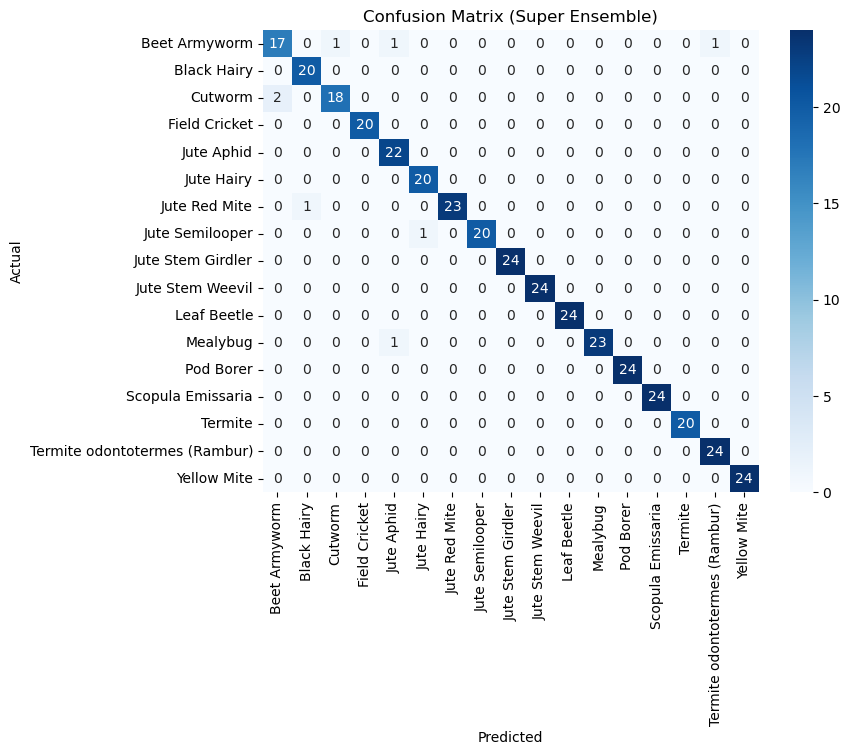

In [6]:
import torch
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import os

# === STEP 1: DEFINE TRANSFORMATIONS ===
val_test_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

# === STEP 2: LOAD THE DATASET AND MODEL ===
# Use the absolute path to the dataset
dataset_path = "D:/Telegram Downloads/Old Materials/Fourth Year First Term/Neural Networks and Deep Learning/Jute_Pest_Notebooks/NoteBook 1/Jute_Pest_Dataset"
test_dataset = ImageFolder(root=f"{dataset_path}/test", transform=val_test_transforms)

# Load the super ensemble model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
super_ensemble = torch.jit.load("super_ensemble_model.pt")
super_ensemble = super_ensemble.to(device)
super_ensemble.eval()

# Get class names
class_names = test_dataset.classes

# === STEP 3: MAKE PREDICTIONS ON A SINGLE IMAGE ===
def predict_single_image(image_path):
    # Load and preprocess the image
    from PIL import Image
    image = Image.open(image_path).convert("RGB")
    image = val_test_transforms(image).unsqueeze(0)  # Add batch dimension
    image = image.to(device)

    # Get probabilities from the model
    with torch.no_grad():
        probs = super_ensemble(image)

    # Get predicted class and confidence
    predicted_class_idx = torch.argmax(probs, dim=1).item()
    confidence = probs[0][predicted_class_idx].item()  # Confidence is the max probability
    predicted_class = class_names[predicted_class_idx]

    print(f"Predicted Class: {predicted_class}")
    print(f"Confidence: {confidence:.4f} (or {confidence * 100:.2f}%)")

    # Optional: Visualize the image with the prediction
    plt.imshow(Image.open(image_path))
    plt.title(f"Predicted: {predicted_class} (Confidence: {confidence * 100:.2f}%)")
    plt.axis("off")
    plt.show()

    return predicted_class, confidence

# Example usage with a single image
image_path = "D:/Telegram Downloads/Old Materials/Fourth Year First Term/Neural Networks and Deep Learning/Jute_Pest_Notebooks/NoteBook 2/Jute_Pest_Dataset/test/Jute Semilooper/Aug_Anomis Sabulifera Guenee_376.jpg"  # Replace with an actual image path
predict_single_image(image_path)

# === STEP 4: MAKE PREDICTIONS ON THE ENTIRE TEST SET ===
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=4)

all_preds, all_labels, all_confidences = [], [], []
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        probs = super_ensemble(images)
        _, predicted = torch.max(probs, 1)
        confidences = torch.max(probs, dim=1)[0]  # Extract max probabilities as confidence scores
        
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        all_confidences.extend(confidences.cpu().numpy())

# Calculate accuracy
test_acc = 100 * (np.array(all_preds) == np.array(all_labels)).sum() / len(all_labels)
print(f"\nTest Accuracy: {test_acc:.2f}%")

# Display predictions with confidence for the first few samples
for i in range(min(5, len(all_preds))):  # Show first 5 predictions
    predicted_class = class_names[all_preds[i]]
    confidence = all_confidences[i]
    true_class = class_names[all_labels[i]]
    print(f"Sample {i + 1}: Predicted: {predicted_class} (Confidence: {confidence * 100:.2f}%), True: {true_class}")

# === STEP 5: VISUALIZE CONFUSION MATRIX ===
conf_matrix = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix (Super Ensemble)")
plt.show()

=== Random Images from Train Dataset ===
Dataset: Train
Image: aug_656.jpg
True Class: Beet Armyworm
Predicted Class: Beet Armyworm
Confidence: 0.7666 (or 76.66%)
Status: Correct
--------------------------------------------------


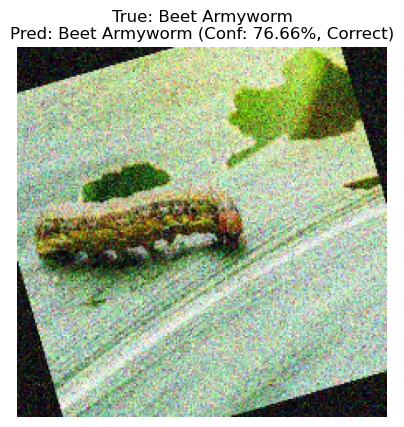

Dataset: Train
Image: aug_348.jpg
True Class: Black Hairy
Predicted Class: Black Hairy
Confidence: 0.5612 (or 56.12%)
Status: Correct
--------------------------------------------------


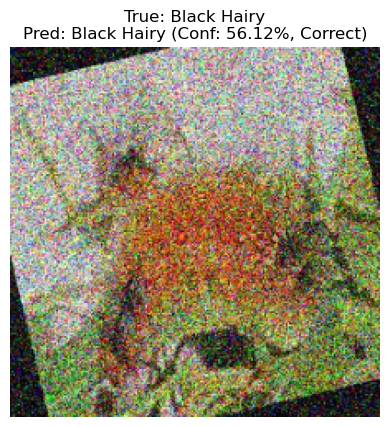

Dataset: Train
Image: aug_432.jpg
True Class: Cutworm
Predicted Class: Cutworm
Confidence: 0.8985 (or 89.85%)
Status: Correct
--------------------------------------------------


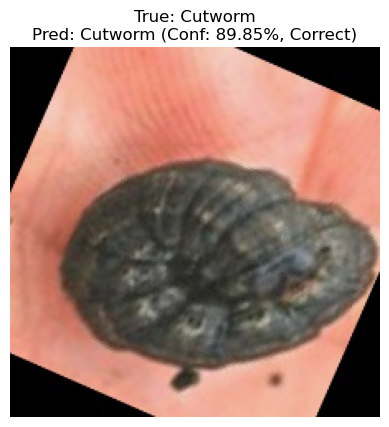

Dataset: Train
Image: field_cricket_0_8027.jpg
True Class: Field Cricket
Predicted Class: Field Cricket
Confidence: 0.9359 (or 93.59%)
Status: Correct
--------------------------------------------------


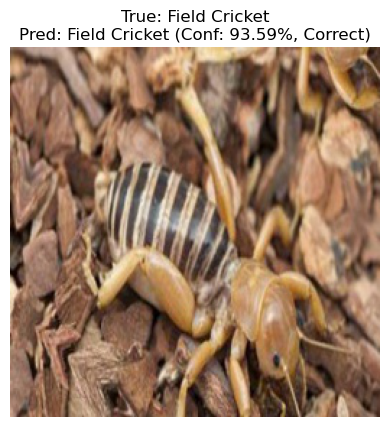

Dataset: Train
Image: Aug_Aphis gossypii Glover_63.jpg
True Class: Jute Aphid
Predicted Class: Jute Aphid
Confidence: 0.8938 (or 89.38%)
Status: Correct
--------------------------------------------------


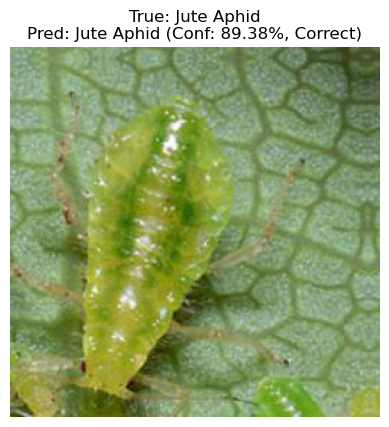

Dataset: Train
Image: spilosoma_obliqua_0_7643.jpg
True Class: Jute Hairy
Predicted Class: Jute Hairy
Confidence: 0.8458 (or 84.58%)
Status: Correct
--------------------------------------------------


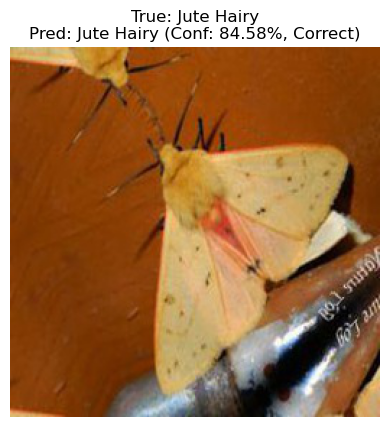

Dataset: Train
Image: Aug_Tetranychus bioculats (Wood-Mason)_296.jpg
True Class: Jute Red Mite
Predicted Class: Jute Red Mite
Confidence: 1.0000 (or 100.00%)
Status: Correct
--------------------------------------------------


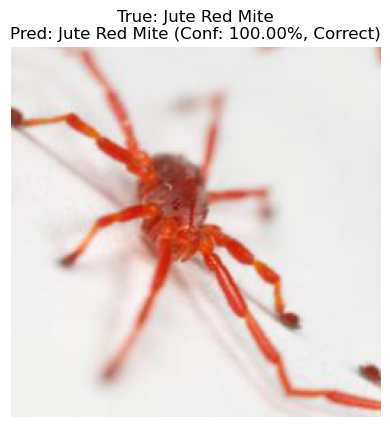

Dataset: Train
Image: Aug_Anomis Sabulifera Guenee_163.jpg
True Class: Jute Semilooper
Predicted Class: Jute Semilooper
Confidence: 0.9821 (or 98.21%)
Status: Correct
--------------------------------------------------


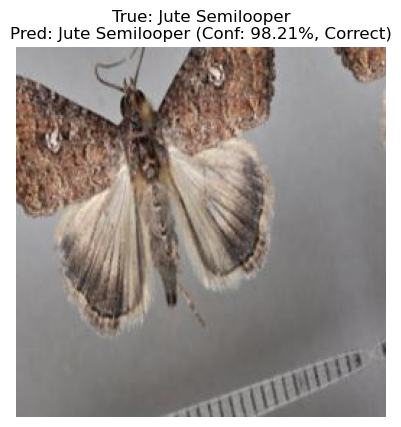

Dataset: Train
Image: aug_440.jpg
True Class: Jute Stem Girdler
Predicted Class: Jute Stem Girdler
Confidence: 0.9995 (or 99.95%)
Status: Correct
--------------------------------------------------


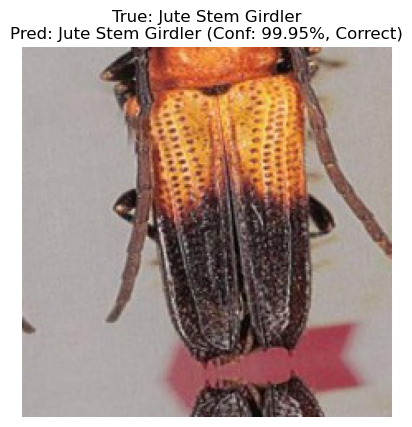

Dataset: Train
Image: Jute_stem_weevil_0_4231.jpg
True Class: Jute Stem Weevil
Predicted Class: Jute Stem Weevil
Confidence: 0.9995 (or 99.95%)
Status: Correct
--------------------------------------------------


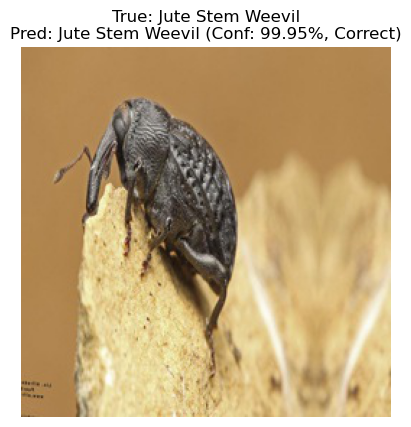

Dataset: Train
Image: aug_588.jpg
True Class: Leaf Beetle
Predicted Class: Leaf Beetle
Confidence: 0.9584 (or 95.84%)
Status: Correct
--------------------------------------------------


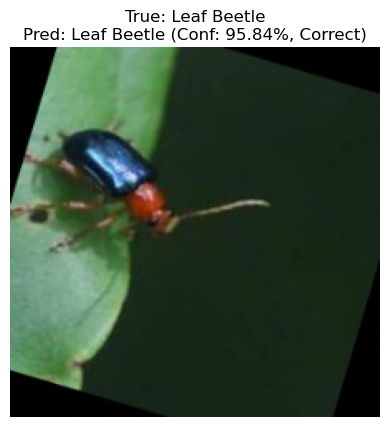

Dataset: Train
Image: aug_533.jpg
True Class: Mealybug
Predicted Class: Mealybug
Confidence: 0.6727 (or 67.27%)
Status: Correct
--------------------------------------------------


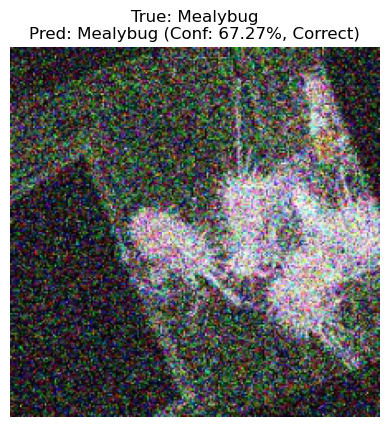

Dataset: Train
Image: Aug_Earias cupreoviridis Walker_249.jpg
True Class: Pod Borer
Predicted Class: Pod Borer
Confidence: 0.9982 (or 99.82%)
Status: Correct
--------------------------------------------------


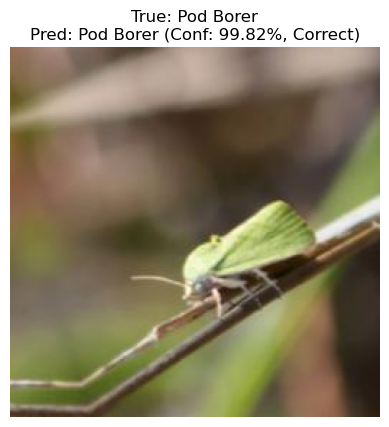

Dataset: Train
Image: aug_521.jpg
True Class: Scopula Emissaria
Predicted Class: Scopula Emissaria
Confidence: 0.9728 (or 97.28%)
Status: Correct
--------------------------------------------------


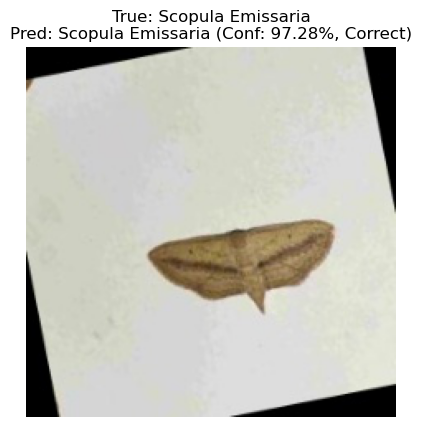

Dataset: Train
Image: aug_323.jpg
True Class: Termite
Predicted Class: Termite
Confidence: 0.9977 (or 99.77%)
Status: Correct
--------------------------------------------------


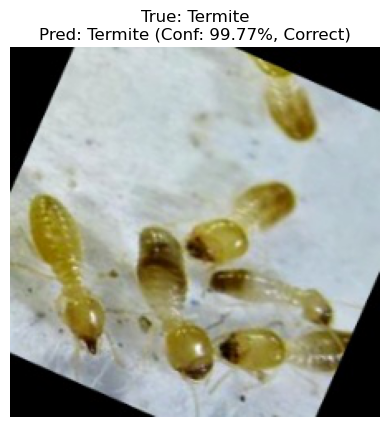

Dataset: Train
Image: aug_645.jpg
True Class: Termite odontotermes (Rambur)
Predicted Class: Termite odontotermes (Rambur)
Confidence: 0.9628 (or 96.28%)
Status: Correct
--------------------------------------------------


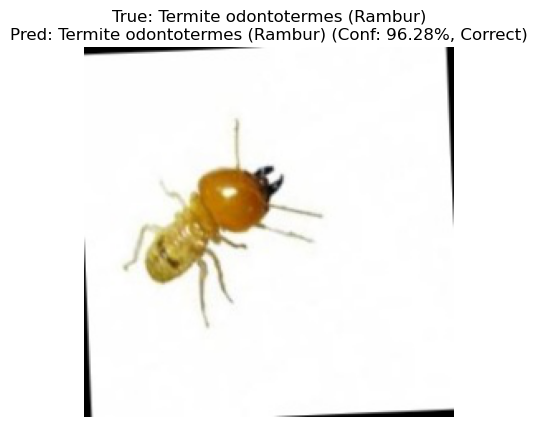

Dataset: Train
Image: aug_507.jpg
True Class: Yellow Mite
Predicted Class: Yellow Mite
Confidence: 0.8109 (or 81.09%)
Status: Correct
--------------------------------------------------


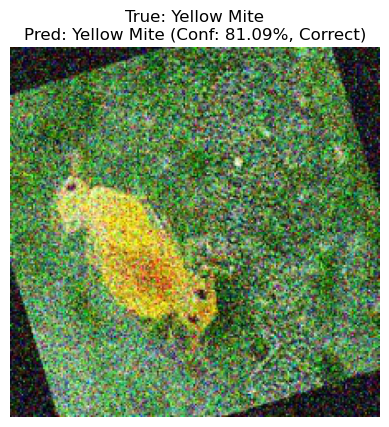

=== Random Images from Test Dataset ===
Dataset: Test
Image: jpg_75-Copy-2-_jpg.rf.4e41b94b1223c159485ff1ecdbb5b189.jpg
True Class: Beet Armyworm
Predicted Class: Beet Armyworm
Confidence: 0.6044 (or 60.44%)
Status: Correct
--------------------------------------------------


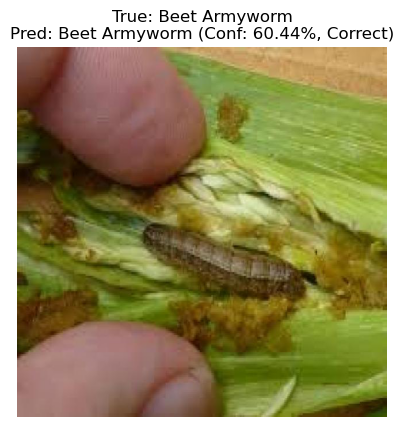

Dataset: Test
Image: Aug_Pericallia ricini Fabricius (form 1)_37.jpg
True Class: Black Hairy
Predicted Class: Black Hairy
Confidence: 0.9971 (or 99.71%)
Status: Correct
--------------------------------------------------


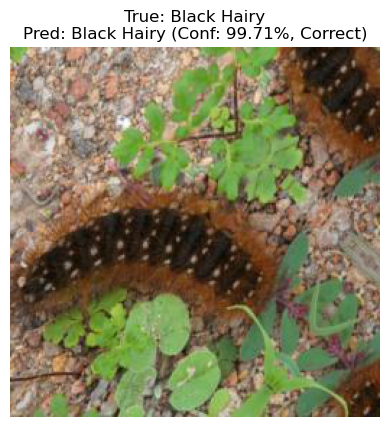

Dataset: Test
Image: 3ff2e0ae-a310-41ef-9ab6-51367214038e_jpg.rf.861cf40c2938592b984a8b35f4b466f1.jpg
True Class: Cutworm
Predicted Class: Cutworm
Confidence: 0.5685 (or 56.85%)
Status: Correct
--------------------------------------------------


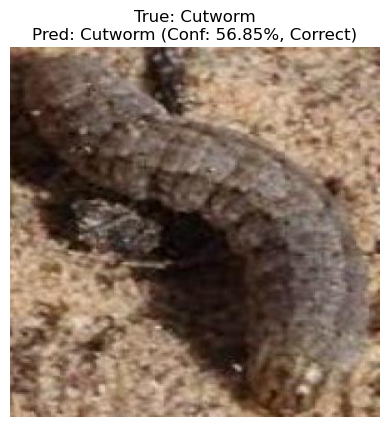

Dataset: Test
Image: field_cricket_0_8968.jpg
True Class: Field Cricket
Predicted Class: Field Cricket
Confidence: 0.7429 (or 74.29%)
Status: Correct
--------------------------------------------------


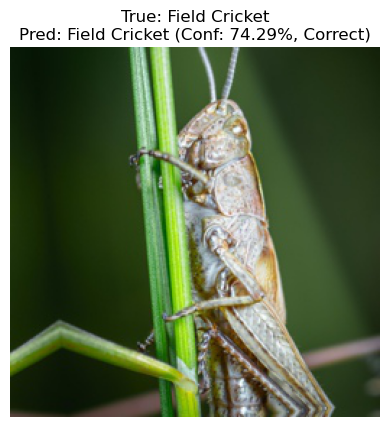

Dataset: Test
Image: Aug_Aphis gossypii Glover_144.jpg
True Class: Jute Aphid
Predicted Class: Jute Aphid
Confidence: 0.8826 (or 88.26%)
Status: Correct
--------------------------------------------------


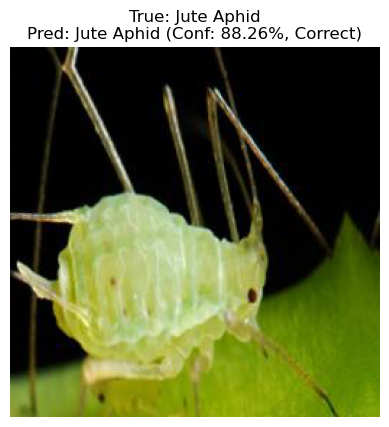

Dataset: Test
Image: spilosoma_obliqua_0_8861.jpg
True Class: Jute Hairy
Predicted Class: Jute Hairy
Confidence: 0.8533 (or 85.33%)
Status: Correct
--------------------------------------------------


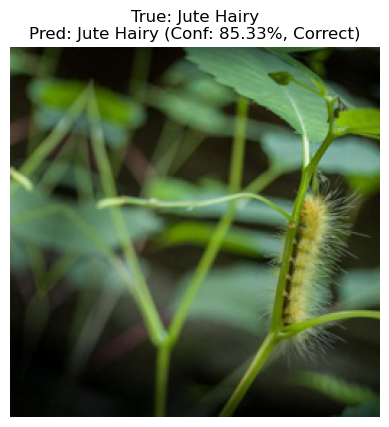

Dataset: Test
Image: red64_jpg.rf.eddb4ec6c3263400c1815c916496d6a7.jpg
True Class: Jute Red Mite
Predicted Class: Jute Red Mite
Confidence: 0.4423 (or 44.23%)
Status: Correct
--------------------------------------------------


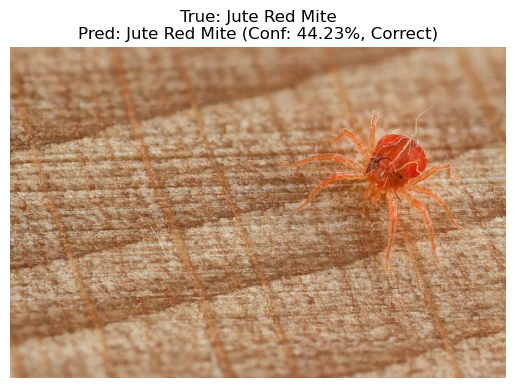

Dataset: Test
Image: Aug_Anomis Sabulifera Guenee_376.jpg
True Class: Jute Semilooper
Predicted Class: Jute Semilooper
Confidence: 0.7503 (or 75.03%)
Status: Correct
--------------------------------------------------


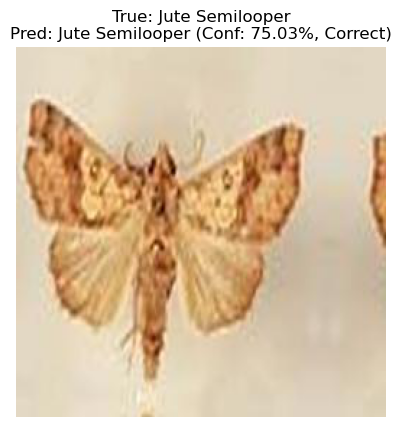

Dataset: Test
Image: Aug_Nupserha bicolor (Dutta)_265.jpg
True Class: Jute Stem Girdler
Predicted Class: Jute Stem Girdler
Confidence: 0.9999 (or 99.99%)
Status: Correct
--------------------------------------------------


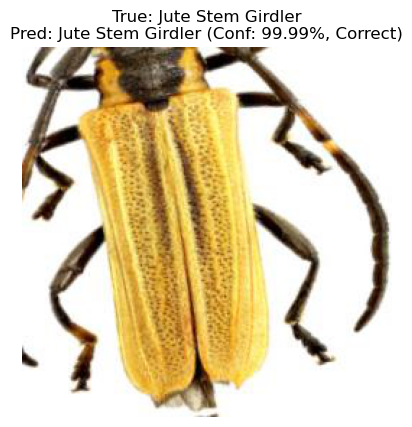

Dataset: Test
Image: Weevil-51-_jpg.rf.4d3a64175617ef4f05a257606338bc7f.jpg
True Class: Jute Stem Weevil
Predicted Class: Jute Stem Weevil
Confidence: 0.9998 (or 99.98%)
Status: Correct
--------------------------------------------------


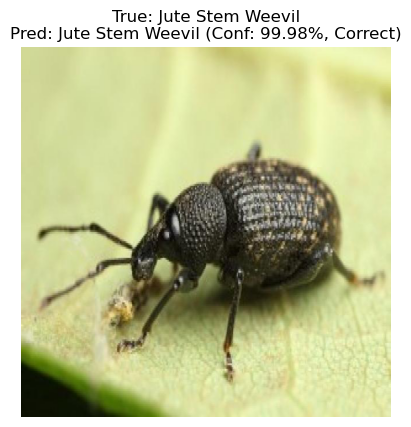

Dataset: Test
Image: Aug_Luperomorpha vittata Duvivier_262.jpg
True Class: Leaf Beetle
Predicted Class: Leaf Beetle
Confidence: 0.9803 (or 98.03%)
Status: Correct
--------------------------------------------------


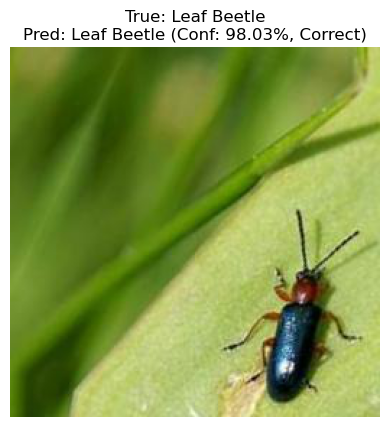

Dataset: Test
Image: Mealy-Bug_450_png.rf.f1212d688ed2f456927785a75bb193de.jpg
True Class: Mealybug
Predicted Class: Mealybug
Confidence: 0.9136 (or 91.36%)
Status: Correct
--------------------------------------------------


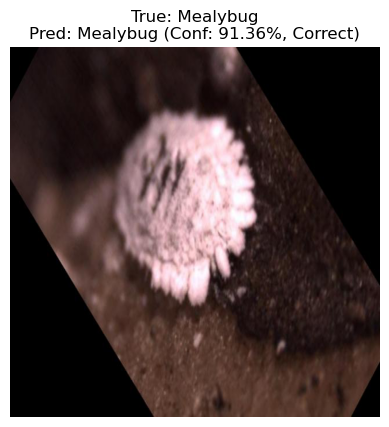

Dataset: Test
Image: Aug_Earias cupreoviridis Walker_335.jpg
True Class: Pod Borer
Predicted Class: Pod Borer
Confidence: 0.9980 (or 99.80%)
Status: Correct
--------------------------------------------------


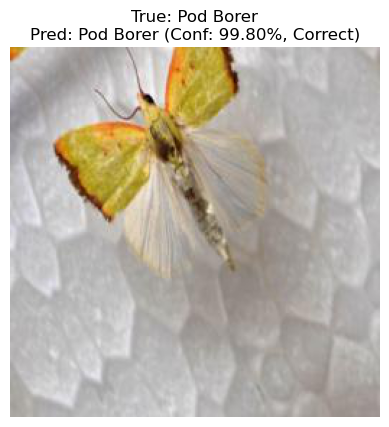

Dataset: Test
Image: Aug_Scopula emissaria Walker_212.jpg
True Class: Scopula Emissaria
Predicted Class: Scopula Emissaria
Confidence: 0.9999 (or 99.99%)
Status: Correct
--------------------------------------------------


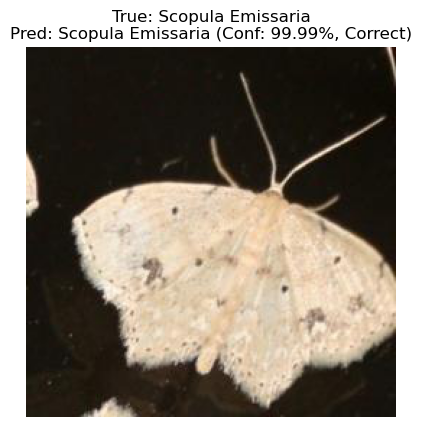

Dataset: Test
Image: Aug_SL8 Microtermes obesi Holmgren_319.jpg
True Class: Termite
Predicted Class: Termite
Confidence: 0.8910 (or 89.10%)
Status: Correct
--------------------------------------------------


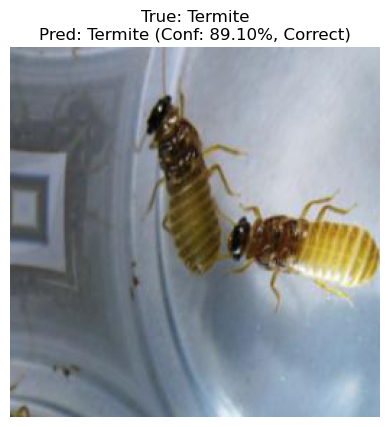

Dataset: Test
Image: Aug_Odontotermes obesus (Rambur)_79.jpg
True Class: Termite odontotermes (Rambur)
Predicted Class: Termite odontotermes (Rambur)
Confidence: 0.9993 (or 99.93%)
Status: Correct
--------------------------------------------------


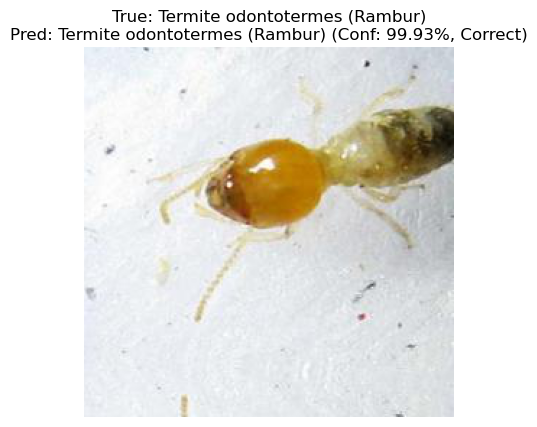

Dataset: Test
Image: yellow_mite_0_6291.jpg
True Class: Yellow Mite
Predicted Class: Yellow Mite
Confidence: 0.7012 (or 70.12%)
Status: Correct
--------------------------------------------------


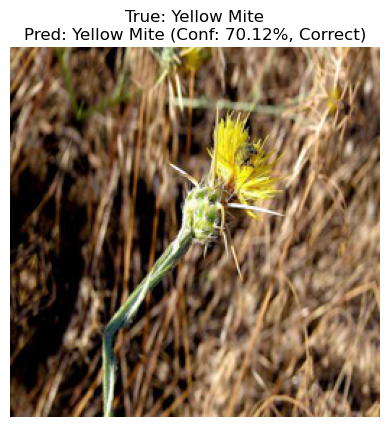

In [7]:
import torch
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import os
import random

# === STEP 1: DEFINE TRANSFORMATIONS ===
val_test_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

# === STEP 2: LOAD THE DATASET AND MODEL ===
# Use the absolute path to the dataset
dataset_path = "D:/Telegram Downloads/Old Materials/Fourth Year First Term/Neural Networks and Deep Learning/Jute_Pest_Notebooks/NoteBook 1/Jute_Pest_Dataset"

# Load train and test datasets
train_dataset = ImageFolder(root=f"{dataset_path}/train", transform=val_test_transforms)
test_dataset = ImageFolder(root=f"{dataset_path}/test", transform=val_test_transforms)

# Load the super ensemble model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
super_ensemble = torch.jit.load("super_ensemble_model.pt")
super_ensemble = super_ensemble.to(device)
super_ensemble.eval()

# Get class names
class_names = train_dataset.classes

# === STEP 3: SELECT RANDOM IMAGES FROM EACH CLASS ===
def get_random_images_per_class(dataset, num_samples=1):
    class_to_images = {}
    for img_path, label in dataset.samples:
        class_name = class_names[label]
        if class_name not in class_to_images:
            class_to_images[class_name] = []
        class_to_images[class_name].append(img_path)
    
    random_images = {}
    for class_name in class_names:
        if class_to_images[class_name]:  # Ensure the class has images
            random_images[class_name] = random.sample(class_to_images[class_name], min(num_samples, len(class_to_images[class_name])))
    
    return random_images

# Get one random image per class from train and test
train_random_images = get_random_images_per_class(train_dataset)
test_random_images = get_random_images_per_class(test_dataset)

# === STEP 4: MAKE PREDICTIONS AND DISPLAY RESULTS ===
def predict_and_display(image_path, true_class, dataset_type):
    # Extract filename from the path
    image_filename = os.path.basename(image_path)

    # Load and preprocess the image
    image = Image.open(image_path).convert("RGB")
    image = val_test_transforms(image).unsqueeze(0)  # Add batch dimension
    image = image.to(device)

    # Get probabilities from the model
    with torch.no_grad():
        probs = super_ensemble(image)

    # Get predicted class and confidence
    predicted_class_idx = torch.argmax(probs, dim=1).item()
    confidence = probs[0][predicted_class_idx].item()  # Confidence is the max probability
    predicted_class = class_names[predicted_class_idx]
    is_correct = "Correct" if predicted_class == true_class else "Incorrect"

    # Display results without the full path
    print(f"Dataset: {dataset_type}")
    print(f"Image: {image_filename}")
    print(f"True Class: {true_class}")
    print(f"Predicted Class: {predicted_class}")
    print(f"Confidence: {confidence:.4f} (or {confidence * 100:.2f}%)")
    print(f"Status: {is_correct}")
    print("-" * 50)

    # Visualize the image with the prediction
    plt.imshow(Image.open(image_path))
    plt.title(f"True: {true_class}\nPred: {predicted_class} (Conf: {confidence * 100:.2f}%, {is_correct})")
    plt.axis("off")
    plt.show()

# Process and display random images from train
print("=== Random Images from Train Dataset ===")
for class_name, image_paths in train_random_images.items():
    for image_path in image_paths:
        predict_and_display(image_path, class_name, "Train")

# Process and display random images from test
print("=== Random Images from Test Dataset ===")
for class_name, image_paths in test_random_images.items():
    for image_path in image_paths:
        predict_and_display(image_path, class_name, "Test")

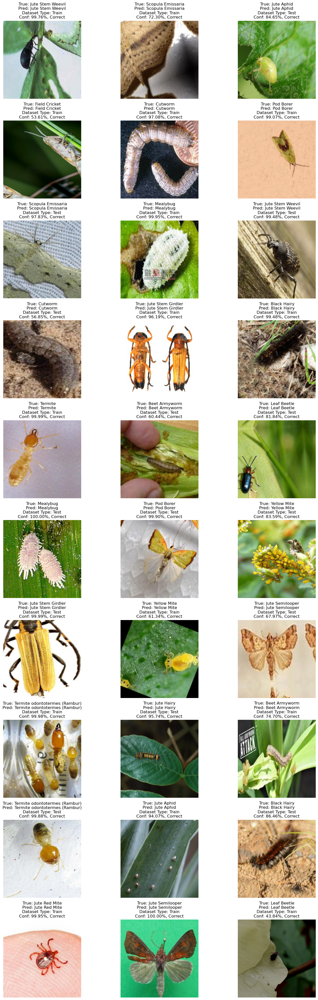

Images saved to: D:/Telegram Downloads/Old Materials/Fourth Year First Term/Neural Networks and Deep Learning/Jute_Pest_Notebooks/Predicted_Images


In [ ]:
import torch
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import os
import random
import shutil

# === STEP 1: DEFINE TRANSFORMATIONS ===
val_test_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

# === STEP 2: LOAD THE DATASET AND MODEL ===
# Use the absolute path to the dataset
dataset_path = "D:/Telegram Downloads/Old Materials/Fourth Year First Term/Neural Networks and Deep Learning/Jute_Pest_Notebooks/NoteBook 1/Jute_Pest_Dataset"

# Load train and test datasets
train_dataset = ImageFolder(root=f"{dataset_path}/train", transform=val_test_transforms)
test_dataset = ImageFolder(root=f"{dataset_path}/test", transform=val_test_transforms)

# Load the super ensemble model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
super_ensemble = torch.jit.load("super_ensemble_model.pt")
super_ensemble = super_ensemble.to(device)
super_ensemble.eval()

# Get class names
class_names = train_dataset.classes

# === STEP 3: SELECT 30 RANDOM IMAGES ACROSS ALL CLASSES ===
def get_random_images(dataset, num_samples_per_class):
    class_to_images = {}
    for img_path, label in dataset.samples:
        class_name = class_names[label]
        if class_name not in class_to_images:
            class_to_images[class_name] = []
        class_to_images[class_name].append((img_path, class_name))
    
    selected_images = []
    for class_name in class_names:
        if class_to_images[class_name]:
            num_to_select = min(num_samples_per_class, len(class_to_images[class_name]))
            selected = random.sample(class_to_images[class_name], num_to_select)
            selected_images.extend(selected)
    
    return selected_images

# Calculate number of images to select per class to reach a total of 30
total_images = 30
num_classes = len(class_names)  # 17 classes
num_samples_per_class = max(1, total_images // (2 * num_classes))  # Divide by 2 because we have train and test

# Get random images from train and test
random.seed(42)  # For reproducibility
train_images = get_random_images(train_dataset, num_samples_per_class)
test_images = get_random_images(test_dataset, num_samples_per_class)

# Combine and ensure we have exactly 30 images
all_images = train_images + test_images
if len(all_images) > total_images:
    all_images = random.sample(all_images, total_images)
elif len(all_images) < total_images:
    # If we have fewer than 30 images, adjust by adding more from remaining classes
    remaining = total_images - len(all_images)
    additional_images = get_random_images(train_dataset, 1) + get_random_images(test_dataset, 1)
    all_images.extend(random.sample(additional_images, min(remaining, len(additional_images))))

# === STEP 4: MAKE PREDICTIONS AND DISPLAY IN A GRID ===
# Create a grid of 10 rows x 3 columns (for 30 images)
fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(15, 40))
axes = axes.flatten()

# Create output folder to save images
output_folder = "D:/Telegram Downloads/Old Materials/Fourth Year First Term/Neural Networks and Deep Learning/Jute_Pest_Notebooks/Predicted_Images"
os.makedirs(output_folder, exist_ok=True)

for idx, (image_path, true_class) in enumerate(all_images):
    # Extract filename from the path
    image_filename = os.path.basename(image_path)

    # Load and preprocess the image
    image = Image.open(image_path).convert("RGB")
    image_tensor = val_test_transforms(image).unsqueeze(0).to(device)

    # Get probabilities from the model
    with torch.no_grad():
        probs = super_ensemble(image_tensor)

    # Get predicted class and confidence
    predicted_class_idx = torch.argmax(probs, dim=1).item()
    confidence = probs[0][predicted_class_idx].item()
    predicted_class = class_names[predicted_class_idx]
    is_correct = "Correct" if predicted_class == true_class else "Incorrect"

    # Display results in the console
    dataset_type = "Train" if "train" in image_path.lower() else "Test"
    # print(f"Dataset: {dataset_type}")
    # print(f"Image: {image_filename}")
    # print(f"True Class: {true_class}")
    # print(f"Predicted Class: {predicted_class}")
    # print(f"Confidence: {confidence:.4f} (or {confidence * 100:.2f}%)")
    # print(f"Status: {is_correct}")
    # print("-" * 50)

    # Display the image in the grid
    ax = axes[idx]
    ax.imshow(image)
    ax.set_title(f"True: {true_class}\nPred: {predicted_class}\nDataset Type: {dataset_type}\nConf: {confidence * 100:.2f}%, {is_correct}")
    ax.axis("off")

    # Save the image to the output folder
    output_path = os.path.join(output_folder, f"{idx+1}_{image_filename}")
    shutil.copy(image_path, output_path)

# Adjust layout and display the grid
plt.tight_layout()
plt.show()

print(f"Images saved to: {output_folder}")